# FairRoute — Hypothesis Matrix Analysis (Custom Modified LLM Serving Sim)

This notebook analyzes **all outputs produced by `run_fairroute_hypothesis_matrix.sh`**
running against the custom-modified LLM Serving Sim (extra per-request columns for
routing score, fairness debt/urgency, locality, prediction, and cache-tier hits).

The matrix script sweeps **30 routing policies** across **6 workload scenarios**
(`balanced_control`, `fairness_conflict`, `locality_conflict`, `prediction_burst`,
`full_adversarial`, `real_workload_1000`), producing one per-request CSV and one
per-replica timeseries CSV per (scenario, policy) pair — 168 runs in total when complete.

### Policy taxonomy analyzed
| Category | Policies |
|---|---|
| Naive baselines | `RR`, `LOAD`, `RAND` |
| Single-signal ablations | `FAIRNESS`, `LOCALITY`, `PREDICTION` |
| Pairwise ablations | `F_L`, `L_P`, `F_P` |
| Naive linear triple | `F_L_P` |
| Prior-art baselines | `PREBLE`, `LBGR`, `DUALMAP`, `CACHE_ROUTE`, `VTC`, `EQUINOX`, `QUARTZ`, `ISJL`, `NEXUSSCHED`, `BALANCEROUTE`, `PILLM`, `ONLINE_LP` |
| **Combination-form hypotheses** (the sharpest novel axis) | `H0`, `H1`, `H2`, `H3`, `H4`, `H5` |
| **FairRoute (final / v2)** | `FAIRROUTE`, `FAIRROUTE_V2` |

### Notebook outline
0. Setup & configuration
1. Load the full hypothesis matrix (168 request-level + 168 timeseries CSVs) & integrity check
2. Per-(scenario, policy) summary metrics — fairness, locality, prediction, latency, throughput, SLO, energy
3. Cross-scenario heatmaps for the core axes
4. Category-level comparison (naive vs. single-signal vs. prior-art vs. hypothesis forms)
5. **Combination-form deep dive**: H0–H5 vs. FAIRROUTE / FAIRROUTE_V2 (linear / multiplicative / gated / learned)
6. Predictive validity: does the `prediction` signal actually track future load?
7. Overall leaderboard — rank aggregation across all scenarios
8. Single-scenario deep dive (parameterizable causal-chain view)
9. Export results


## 0. Setup & configuration

In [1]:

import os
import re
import glob
import ast
import json
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from IPython.display import display

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid", context="notebook")
pd.set_option("display.max_columns", 60)
pd.set_option("display.width", 160)

# ---------------------------------------------------------------------------
# DATA_DIR: point this at the folder produced by run_fairroute_hypothesis_matrix.sh
# (i.e. the directory that directly contains "<scenario>_policy_<POLICY>.csv" files,
# named "fairroute_hypothesis" by default in the script's OUTPUT_DIR variable).
# We try a few common locations and fall back to the first one that exists.
# ---------------------------------------------------------------------------
_CANDIDATES = [
    os.environ.get("FAIRROUTE_DATA_DIR", ""),
    "./fairroute_hypothesis",
    "./outputs/fairroute_hypothesis",
    "../outputs/fairroute_hypothesis",
    "/mnt/user-data/uploads/fairroute_hypothesis",
    "/mnt/user-data/uploads",
]
DATA_DIR = next((p for p in _CANDIDATES if p and os.path.isdir(p)
                  and glob.glob(os.path.join(p, "*_policy_*.csv"))), None)
if DATA_DIR is None:
    DATA_DIR = "./fairroute_hypothesis"  # edit this manually if auto-detect fails
print(f"Using DATA_DIR = {DATA_DIR!r}")

SLO_TTFT_MS = 100.0      # time-to-first-token SLO
SLO_E2E_MS = 15000.0     # end-to-end latency SLO

# ---------------------------------------------------------------------------
# Policy taxonomy
# ---------------------------------------------------------------------------
POLICY_CATEGORY = {
    "RR": "Naive", "LOAD": "Naive", "RAND": "Naive",
    "FAIRNESS": "Single-Signal", "LOCALITY": "Single-Signal", "PREDICTION": "Single-Signal",
    "F_L": "Pairwise", "L_P": "Pairwise", "F_P": "Pairwise",
    "F_L_P": "Naive Linear Triple",
    "PREBLE": "Prior Art", "LBGR": "Prior Art", "DUALMAP": "Prior Art",
    "CACHE_ROUTE": "Prior Art", "VTC": "Prior Art", "EQUINOX": "Prior Art",
    "QUARTZ": "Prior Art", "ISJL": "Prior Art", "NEXUSSCHED": "Prior Art",
    "BALANCEROUTE": "Prior Art", "PILLM": "Prior Art", "ONLINE_LP": "Prior Art",
    "H0": "Combination-Form Hypothesis", "H1": "Combination-Form Hypothesis",
    "H2": "Combination-Form Hypothesis", "H3": "Combination-Form Hypothesis",
    "H4": "Combination-Form Hypothesis", "H5": "Combination-Form Hypothesis",
    "FAIRROUTE": "FairRoute (Final)", "FAIRROUTE_V2": "FairRoute (v2 / H5)",
}

POLICY_ORDER = [
    "RR", "LOAD", "RAND",
    "FAIRNESS", "LOCALITY", "PREDICTION",
    "F_L", "L_P", "F_P", "F_L_P",
    "PREBLE", "LBGR", "DUALMAP", "CACHE_ROUTE", "VTC", "EQUINOX", "QUARTZ", "ISJL",
    "NEXUSSCHED", "BALANCEROUTE", "PILLM", "ONLINE_LP",
    "H0", "H1", "H2", "H3", "H4", "H5", "FAIRROUTE", "FAIRROUTE_V2",
]

CATEGORY_COLOR = {
    "Naive": "#9e9e9e",
    "Single-Signal": "#64b5f6",
    "Pairwise": "#4fc3f7",
    "Naive Linear Triple": "#26a69a",
    "Prior Art": "#ba68c8",
    "Combination-Form Hypothesis": "#ffb74d",
    "FairRoute (Final)": "#e53935",
    "FairRoute (v2 / H5)": "#d32f2f",
}
PALETTE = {p: CATEGORY_COLOR[c] for p, c in POLICY_CATEGORY.items()}

FORM_POLICIES = ["H0", "H1", "H2", "H3", "H4", "H5", "FAIRROUTE", "FAIRROUTE_V2"]
SCENARIO_ORDER = [
    "balanced_control", "fairness_conflict", "locality_conflict",
    "prediction_burst", "full_adversarial", "real_workload_1000",
]

def jains_index(values):
    """Jain's Fairness Index over a set of per-client service totals."""
    values = np.asarray(list(values), dtype=float)
    values = values[~np.isnan(values)]
    if len(values) == 0 or values.sum() <= 0:
        return 1.0
    return (values.sum() ** 2) / (len(values) * np.square(values).sum())

def itl_jitter_cv(itl_str):
    """Coefficient of variation of inter-token latency, parsed from the raw
    cumulative-timestamp ITL list stored per request."""
    try:
        vals = ast.literal_eval(itl_str)
        if not isinstance(vals, list) or len(vals) < 3:
            return np.nan
        diffs = np.diff(np.asarray(vals, dtype=float))
        diffs = diffs[diffs >= 0]
        if len(diffs) == 0 or diffs.mean() == 0:
            return np.nan
        return diffs.std() / diffs.mean()
    except Exception:
        return np.nan

def savefig_note(title):
    plt.suptitle(title, fontsize=11, y=1.02)
    plt.tight_layout()

def ordered(items, order):
    present = [p for p in order if p in set(items)]
    rest = [p for p in items if p not in order]
    return present + rest


Using DATA_DIR = '../outputs/fairroute_hypothesis'


## 1. Load the full hypothesis matrix & integrity check

In [2]:

run_paths = sorted(glob.glob(os.path.join(DATA_DIR, "*_policy_*.csv")))
run_paths = [p for p in run_paths if not p.endswith("_timeseries.csv")]
print(f"Found {len(run_paths)} per-request result files in {DATA_DIR}")

_FILENAME_RE = re.compile(r"^(?P<scenario>.+)_policy_(?P<policy>[A-Z0-9_]+)\.csv$")

frames = []
for path in run_paths:
    fname = os.path.basename(path)
    m = _FILENAME_RE.match(fname)
    if not m:
        continue
    frame = pd.read_csv(path)
    frame["scenario"] = m.group("scenario")
    frame["policy_name"] = m.group("policy").upper()
    frames.append(frame)

assert frames, f"No matrix outputs found under {DATA_DIR} — check DATA_DIR."
requests_df = pd.concat(frames, ignore_index=True)

# --- unit conversions (raw fields are nanoseconds) ---
for src, dst in [("latency", "latency_ms"), ("queuing_delay", "queuing_delay_ms"),
                  ("TTFT", "TTFT_ms"), ("TPOT", "TPOT_ms")]:
    requests_df[dst] = requests_df[src] / 1e6

requests_df["prefix_hit_ratio"] = (
    requests_df["prefix_cache_hit"] / requests_df["input"].replace(0, np.nan)
).fillna(0.0).clip(0, 1)

requests_df["cache_hit_tokens"] = (
    requests_df[["prefix_cache_hit", "npu_cache_hit", "storage_cache_hit"]].max(axis=1)
)

requests_df["slo_met"] = (
    (requests_df["TTFT_ms"] <= SLO_TTFT_MS) & (requests_df["latency_ms"] <= SLO_E2E_MS)
)
requests_df["queue_delay_fraction"] = (
    requests_df["queuing_delay_ms"] / requests_df["latency_ms"].replace(0, np.nan)
).fillna(0.0)

requests_df["category"] = requests_df["policy_name"].map(POLICY_CATEGORY).fillna("Other")
requests_df["scenario"] = pd.Categorical(requests_df["scenario"], categories=SCENARIO_ORDER, ordered=True)
requests_df["policy_name"] = pd.Categorical(requests_df["policy_name"], categories=POLICY_ORDER, ordered=True)

print(f"Loaded {len(requests_df):,} requests across "
      f"{requests_df['scenario'].nunique()} scenarios x {requests_df['policy_name'].nunique()} policies")

coverage = requests_df.groupby(["scenario", "policy_name"], observed=True).size().unstack(fill_value=0)
missing = coverage[coverage.columns[(coverage == 0).any()]] if (coverage == 0).values.any() else None
print("\n=== Run coverage (rows per scenario x policy) ===")
display(coverage)
if (coverage == 0).values.any():
    print("\n WARNING: missing (scenario, policy) combinations detected above (cells = 0).")
else:
    print("\nFull matrix present: no missing (scenario, policy) combinations.")


Found 180 per-request result files in ../outputs/fairroute_hypothesis
Loaded 180,000 requests across 6 scenarios x 30 policies

=== Run coverage (rows per scenario x policy) ===


policy_name,RR,LOAD,RAND,FAIRNESS,LOCALITY,PREDICTION,F_L,L_P,F_P,F_L_P,PREBLE,LBGR,DUALMAP,CACHE_ROUTE,VTC,EQUINOX,QUARTZ,ISJL,NEXUSSCHED,BALANCEROUTE,PILLM,ONLINE_LP,H0,H1,H2,H3,H4,H5,FAIRROUTE,FAIRROUTE_V2
scenario,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
balanced_control,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
fairness_conflict,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
locality_conflict,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
prediction_burst,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
full_adversarial,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
real_workload_1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000



Full matrix present: no missing (scenario, policy) combinations.


In [3]:

# Matrix run-health, if the script's own status/log files are present alongside the CSVs
status_path = os.path.join(DATA_DIR, "matrix_status.txt")
if os.path.isfile(status_path):
    with open(status_path, "r", errors="replace") as fh:
        print("=== matrix_status.txt ===")
        print(fh.read().strip())
else:
    print("No matrix_status.txt found (this is informational only).")


=== matrix_status.txt ===
2026-09-14T16:56:36+00:00 status=COMPLETE cache_mode=xpu total=180 completed=180 skipped=0 active=0 failed=0 remaining=0 current=


In [4]:

# --- Timeseries (per-replica system-pressure) CSVs ---
ts_paths = sorted(glob.glob(os.path.join(DATA_DIR, "*_policy_*_timeseries.csv")))
ts_frames = []
for path in ts_paths:
    fname = os.path.basename(path)
    m = re.match(r"^(?P<scenario>.+)_policy_(?P<policy>[A-Z0-9_]+)_timeseries\.csv$", fname)
    if not m:
        continue
    t = pd.read_csv(path)
    t["scenario"] = m.group("scenario")
    t["policy_name"] = m.group("policy").upper()
    ts_frames.append(t)

if ts_frames:
    ts_df = pd.concat(ts_frames, ignore_index=True)
    ts_df["scenario"] = pd.Categorical(ts_df["scenario"], categories=SCENARIO_ORDER, ordered=True)
    ts_df["policy_name"] = pd.Categorical(ts_df["policy_name"], categories=POLICY_ORDER, ordered=True)
    print(f"Loaded {len(ts_df):,} timeseries samples from {len(ts_paths)} files")
else:
    ts_df = pd.DataFrame()
    print("No timeseries CSVs found.")


Loaded 76,120 timeseries samples from 180 files


## 2. Per-(scenario, policy) summary metrics

One row per (scenario, policy) combination covering routing behaviour, fairness,
locality, prediction, latency, throughput, preemption, SLO/goodput, and an energy
proxy — the full metrics framework from the Experimental Roadmap, computed across
the entire matrix at once.

In [5]:

GROUP = ["scenario", "policy_name"]

# --- fairness: Jain's index over per-client total output tokens ---
client_service = (
    requests_df.groupby(GROUP + ["client id"], observed=True)["output"].sum().reset_index()
)
jain_tbl = (
    client_service.groupby(GROUP, observed=True)["output"]
    .apply(jains_index).reset_index(name="jains_index")
)

# --- replica load balance: coefficient of variation of requests/replica ---
replica_load = (
    requests_df.groupby(GROUP + ["instance id"], observed=True).size().reset_index(name="n")
)
load_cv_tbl = (
    replica_load.groupby(GROUP, observed=True)["n"]
    .apply(lambda x: x.std(ddof=0) / x.mean() if x.mean() else 0.0)
    .reset_index(name="replica_load_cv")
)

# --- decode jitter from ITL (coefficient of variation of inter-token latency) ---
print("Parsing ITL token-timing lists for decode-jitter (this takes ~30-60s for the full matrix)...")
requests_df["itl_cv"] = requests_df["ITL"].apply(itl_jitter_cv)

# --- correlation between predicted benefit and actual queueing delay realized ---
def _pred_corr(g):
    if g["prediction"].nunique() < 2:
        return np.nan
    return g["prediction"].corr(g["queuing_delay_ms"])
pred_corr_tbl = (
    requests_df.groupby(GROUP, observed=True)
    .apply(_pred_corr).reset_index(name="prediction_vs_actual_queue_corr")
)

# --- main aggregate summary ---
summary = requests_df.groupby(GROUP, observed=True).agg(
    n_requests=("request id", "count"),
    n_clients=("client id", "nunique"),
    n_replicas=("instance id", "nunique"),
    mean_fairness_debt=("fairness debt", "mean"),
    p95_fairness_debt=("fairness debt", lambda x: np.percentile(x, 95)),
    max_fairness_debt=("fairness debt", "max"),
    mean_fairness_urgency=("fairness urgency", "mean"),
    mean_prefix_hit_ratio=("prefix_hit_ratio", "mean"),
    total_recompute_tokens=("recompute_tokens", "sum"),
    total_cache_hit_tokens=("cache_hit_tokens", "sum"),
    mean_routing_score=("routing score", "mean"),
    mean_score_margin=("routing score margin", "mean"),
    ttft_p50_ms=("TTFT_ms", lambda x: x.quantile(0.50)),
    ttft_p99_ms=("TTFT_ms", lambda x: x.quantile(0.99)),
    tpot_p50_ms=("TPOT_ms", lambda x: x.quantile(0.50)),
    tpot_p99_ms=("TPOT_ms", lambda x: x.quantile(0.99)),
    e2e_p50_ms=("latency_ms", lambda x: x.quantile(0.50)),
    e2e_p99_ms=("latency_ms", lambda x: x.quantile(0.99)),
    queue_p50_ms=("queuing_delay_ms", lambda x: x.quantile(0.50)),
    queue_p99_ms=("queuing_delay_ms", lambda x: x.quantile(0.99)),
    mean_queue_delay_fraction=("queue_delay_fraction", "mean"),
    mean_itl_jitter_cv=("itl_cv", "mean"),
    total_preemptions=("num_preemptions", "sum"),
    slo_attainment_pct=("slo_met", lambda x: 100.0 * x.mean()),
    total_output_tokens=("output", "sum"),
    end_time_s=("end_time", lambda x: x.max() / 1e9),
).reset_index()

summary["req_throughput_sps"] = summary["n_requests"] / summary["end_time_s"].replace(0, np.nan)
summary["token_throughput_tps"] = summary["total_output_tokens"] / summary["end_time_s"].replace(0, np.nan)
summary["goodput_sps"] = (summary["slo_attainment_pct"] / 100.0) * summary["req_throughput_sps"]
summary["energy_proxy_kj"] = (summary["end_time_s"] * 250.0) / 1000.0  # 250W NPU proxy, wall-clock basis

summary = (
    summary.merge(jain_tbl, on=GROUP)
    .merge(load_cv_tbl, on=GROUP)
    .merge(pred_corr_tbl, on=GROUP)
)
summary["category"] = summary["policy_name"].map(POLICY_CATEGORY)

# --- fold in timeseries system-pressure signals, if available ---
if not ts_df.empty:
    ts_summary = ts_df.groupby(GROUP, observed=True).agg(
        mean_kv_util_pct=("kv_util_pct", "mean"),
        peak_kv_util_pct=("kv_util_pct", "max"),
        mean_waiting_reqs=("waiting_reqs", "mean"),
        mean_npu_util_pct=("npu_util_pct", "mean"),
    ).reset_index()
    summary = summary.merge(ts_summary, on=GROUP, how="left")

summary = summary.round(4)
print(f"Summary table: {summary.shape[0]} (scenario, policy) rows x {summary.shape[1]} metrics")
display(summary.head(10))


Parsing ITL token-timing lists for decode-jitter (this takes ~30-60s for the full matrix)...
Summary table: 180 (scenario, policy) rows x 40 metrics


,scenario,policy_name,n_requests,n_clients,n_replicas,mean_fairness_debt,p95_fairness_debt,max_fairness_debt,mean_fairness_urgency,mean_prefix_hit_ratio,total_recompute_tokens,total_cache_hit_tokens,mean_routing_score,mean_score_margin,ttft_p50_ms,ttft_p99_ms,tpot_p50_ms,tpot_p99_ms,e2e_p50_ms,e2e_p99_ms,queue_p50_ms,queue_p99_ms,mean_queue_delay_fraction,mean_itl_jitter_cv,total_preemptions,slo_attainment_pct,total_output_tokens,end_time_s,req_throughput_sps,token_throughput_tps,goodput_sps,energy_proxy_kj,jains_index,replica_load_cv,prediction_vs_actual_queue_corr,category,mean_kv_util_pct,peak_kv_util_pct,mean_waiting_reqs,mean_npu_util_pct
0,balanced_control,RR,1000,10,4,0.0000,0.0000,0.0,0.0000,0.000,510057,0,0.0000,0.0000,30.5870,44.4988,11.7044,11.9707,1515.4601,2248.4587,5.8370,11.2435,0.0041,6.4227,0,100.0,127843,101.5264,9.8497,1259.2094,9.8497,25.3816,0.9995,0.0000,NaN,Naive,0.5404,1.301,0.1757,32.2060
1,balanced_control,LOAD,1000,10,4,0.0000,0.0000,0.0,0.0000,0.001,509785,272,0.0000,0.0000,30.3272,44.7865,11.8763,12.3745,1534.6554,2290.3015,5.6950,11.2689,0.0040,5.9983,0,100.0,127843,101.5164,9.8506,1259.3329,9.8506,25.3791,0.9995,0.4978,NaN,Naive,0.4586,0.886,0.1782,30.9737
2,balanced_control,RAND,1000,10,4,0.0000,0.0000,0.0,0.0000,0.000,510057,0,0.0000,0.0000,30.4469,44.3988,11.7727,12.4700,1532.9671,2291.7350,5.6311,11.2371,0.0040,6.2538,0,100.0,127843,101.5173,9.8505,1259.3225,9.8505,25.3793,0.9995,0.0343,NaN,Naive,0.5507,1.910,0.1609,32.2475
3,balanced_control,FAIRNESS,1000,10,4,0.0313,0.0900,1.0,0.0485,0.001,509785,272,0.0485,0.0074,30.3158,44.7198,11.7747,12.3391,1520.4161,2260.2002,5.8100,11.1778,0.0040,6.3364,0,100.0,127843,101.5346,9.8489,1259.1073,9.8489,25.3837,0.9995,0.3022,-0.0350,Single-Signal,0.4842,1.348,0.1733,31.3840
4,balanced_control,LOCALITY,1000,10,4,0.0315,0.0900,1.0,0.0487,0.001,509785,272,0.5005,0.0010,30.6165,44.4456,11.7497,12.6049,1526.9685,2294.8815,5.6750,11.2826,0.0040,6.3661,0,100.0,127843,101.5429,9.8481,1259.0045,9.8481,25.3857,0.9995,0.0147,-0.0513,Single-Signal,0.5450,1.942,0.1906,32.1879
5,balanced_control,PREDICTION,1000,10,4,0.0312,0.0889,1.0,0.0483,0.000,510057,0,0.9990,0.2928,30.3845,44.7852,11.8675,12.3276,1530.0204,2291.4940,5.4866,11.2141,0.0040,6.1144,0,100.0,127843,101.5145,9.8508,1259.3568,9.8508,25.3786,0.9995,0.4904,-0.0821,Single-Signal,0.4593,0.886,0.1980,31.0112
6,balanced_control,F_L,1000,10,4,0.0313,0.0900,1.0,0.0485,0.001,509785,272,0.2745,0.0042,30.3158,44.7198,11.7747,12.3391,1520.4161,2260.2002,5.8100,11.1778,0.0040,6.3364,0,100.0,127843,101.5346,9.8489,1259.1073,9.8489,25.3837,0.9995,0.3022,-0.0350,Pairwise,0.4842,1.348,0.1733,31.3840
7,balanced_control,L_P,1000,10,4,0.0312,0.0889,1.0,0.0483,0.000,510057,0,0.7492,0.1464,30.3845,44.7852,11.8675,12.3276,1530.0204,2291.4940,5.4866,11.2141,0.0040,6.1144,0,100.0,127843,101.5145,9.8508,1259.3568,9.8508,25.3786,0.9995,0.4904,-0.0821,Pairwise,0.4593,0.886,0.1980,31.0112
8,balanced_control,F_P,1000,10,4,0.0312,0.0889,1.0,0.0483,0.000,510057,0,0.5234,0.1531,30.3845,44.7852,11.8675,12.3276,1530.0204,2291.4940,5.4866,11.2141,0.0040,6.1144,0,100.0,127843,101.5145,9.8508,1259.3568,9.8508,25.3786,0.9995,0.4904,-0.0821,Pairwise,0.4593,0.886,0.1980,31.0112
9,balanced_control,F_L_P,1000,10,4,0.0312,0.0889,1.0,0.0483,0.000,510057,0,0.5154,0.1020,30.3845,44.7852,11.8675,12.3276,1530.0204,2291.4940,5.4866,11.2141,0.0040,6.1144,0,100.0,127843,101.5145,9.8508,1259.3568,9.8508,25.3786,0.9995,0.4904,-0.0821,Naive Linear Triple,0.4593,0.886,0.1980,31.0112


In [6]:

os.makedirs("./outputs", exist_ok=True)
summary.to_csv("./outputs/fairroute_hypothesis_summary.csv", index=False)
print("Saved full per-(scenario,policy) summary to fairroute_hypothesis_summary.csv")


Saved full per-(scenario,policy) summary to fairroute_hypothesis_summary.csv


## 3. Cross-scenario heatmaps for the core axes

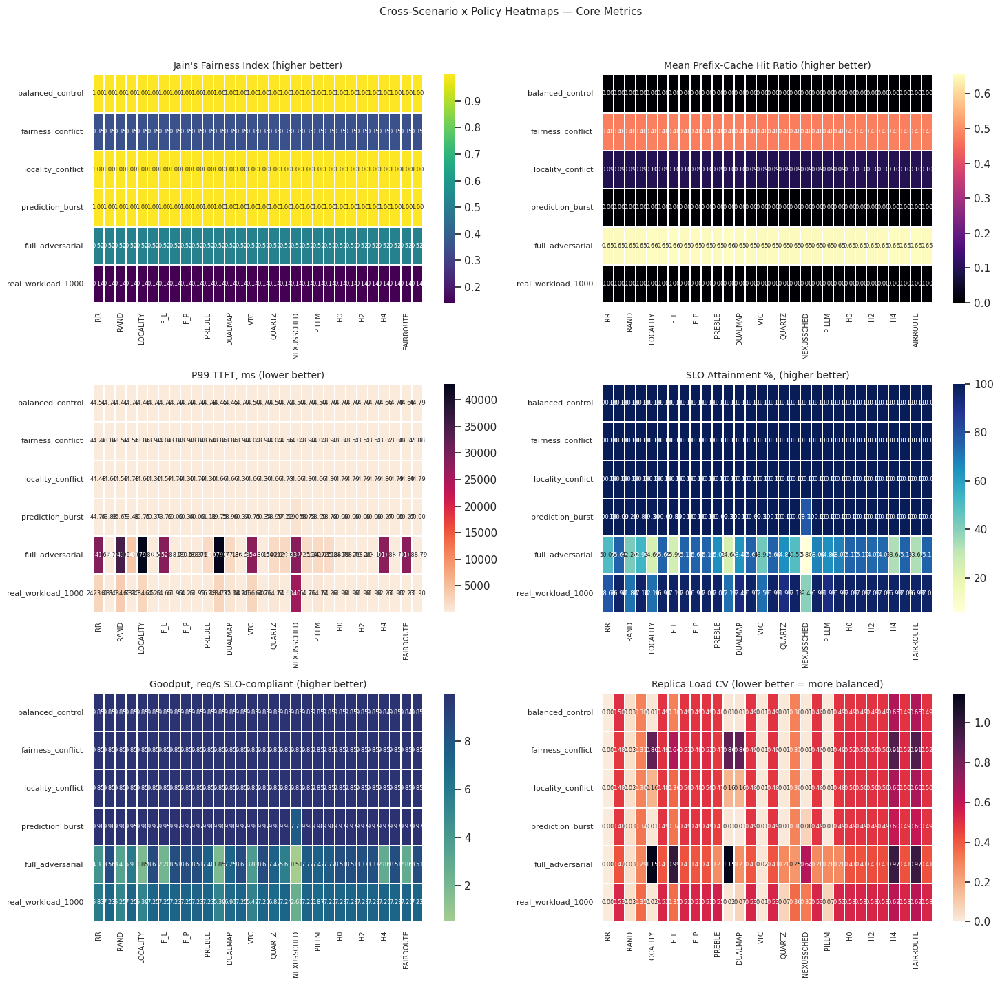

In [7]:

heatmap_metrics = [
    ("jains_index", "Jain's Fairness Index (higher better)", "viridis"),
    ("mean_prefix_hit_ratio", "Mean Prefix-Cache Hit Ratio (higher better)", "magma"),
    ("ttft_p99_ms", "P99 TTFT, ms (lower better)", "rocket_r"),
    ("slo_attainment_pct", "SLO Attainment %, (higher better)", "YlGnBu"),
    ("goodput_sps", "Goodput, req/s SLO-compliant (higher better)", "crest"),
    ("replica_load_cv", "Replica Load CV (lower better = more balanced)", "rocket_r"),
]

fig, axes = plt.subplots(3, 2, figsize=(15, 14))
for axis, (metric, title, cmap) in zip(axes.flat, heatmap_metrics):
    pivot = summary.pivot(index="scenario", columns="policy_name", values=metric)
    pivot = pivot.reindex(columns=[p for p in POLICY_ORDER if p in pivot.columns])
    sns.heatmap(pivot, annot=True, fmt=".2f", cmap=cmap, ax=axis,
                cbar=True, annot_kws={"size": 6}, linewidths=0.3)
    axis.set_title(title, fontsize=10)
    axis.set_xlabel("")
    axis.set_ylabel("")
    axis.tick_params(axis="x", rotation=90, labelsize=7)
    axis.tick_params(axis="y", rotation=0, labelsize=8)
savefig_note("Cross-Scenario x Policy Heatmaps — Core Metrics")
plt.show()


## 4. Category-level comparison

Groups the 30 policies into the taxonomy above and compares them across scenarios,
to see whether *any* signal combination beats the naive baselines, and whether
prior-art single/dual-concern routers plateau where FairRoute's joint score does not.

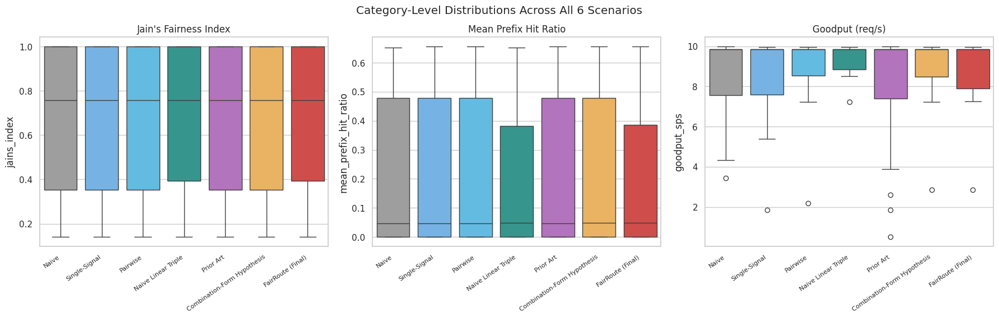

In [8]:

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))
metric_specs = [
    ("jains_index", "Jain's Fairness Index"),
    ("mean_prefix_hit_ratio", "Mean Prefix Hit Ratio"),
    ("goodput_sps", "Goodput (req/s)"),
]
cat_order = ["Naive", "Single-Signal", "Pairwise", "Naive Linear Triple",
             "Prior Art", "Combination-Form Hypothesis", "FairRoute (Final)"]
for axis, (metric, title) in zip(axes, metric_specs):
    sns.boxplot(data=summary, x="category", y=metric, order=cat_order,
                palette=CATEGORY_COLOR, ax=axis)
    axis.set_title(title)
    axis.set_xlabel("")
    axis.tick_params(axis="x", rotation=35, labelsize=8)
    for label in axis.get_xticklabels():
        label.set_ha("right")
plt.tight_layout()
plt.suptitle("Category-Level Distributions Across All 6 Scenarios", y=1.03)
plt.show()


## 5. Combination-form deep dive — H0–H5 vs. FAIRROUTE / FAIRROUTE_V2

This is the sharpest novel experimental axis: for a *fixed* set of fairness/locality/
prediction signals, does the way they are combined (linear `H0`, multiplicative `H1`,
gated/lexicographic `H2`/`H3`, learned `H4`, deficit-driven `H5`/`FAIRROUTE_V2`) change outcomes, and does FairRoute's
selected form actually win?

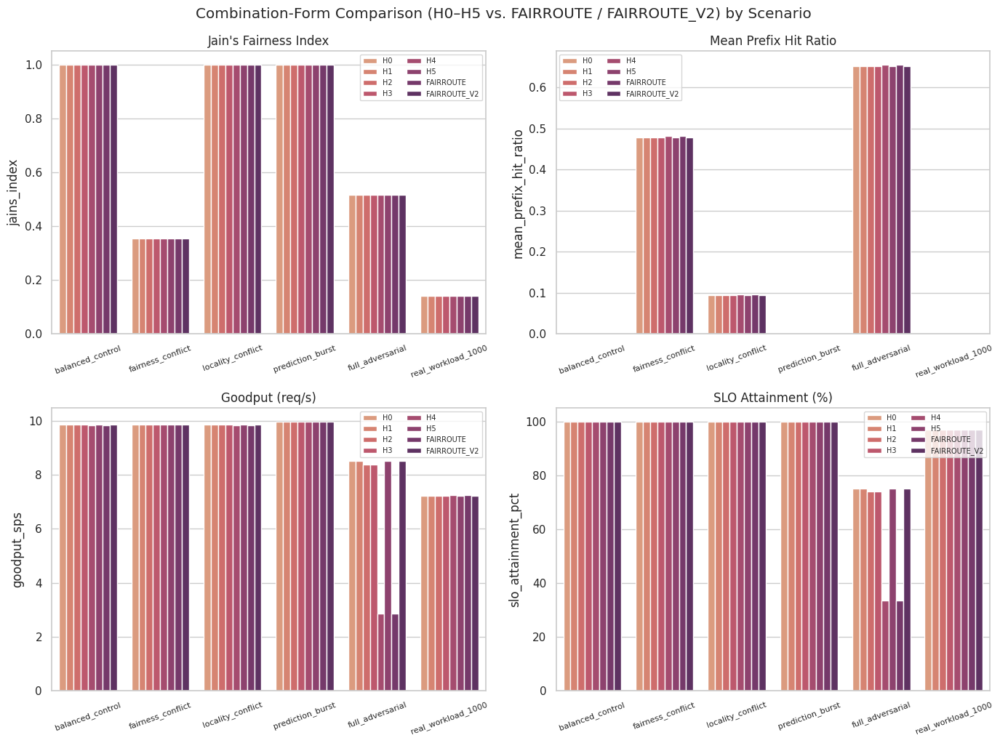

In [9]:

form_summary = summary[summary["policy_name"].isin(FORM_POLICIES)].copy()
form_summary["policy_name"] = pd.Categorical(form_summary["policy_name"], categories=FORM_POLICIES, ordered=True)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
form_metrics = [
    ("jains_index", "Jain's Fairness Index"),
    ("mean_prefix_hit_ratio", "Mean Prefix Hit Ratio"),
    ("goodput_sps", "Goodput (req/s)"),
    ("slo_attainment_pct", "SLO Attainment (%)"),
]
for axis, (metric, title) in zip(axes.flat, form_metrics):
    sns.barplot(data=form_summary, x="scenario", y=metric, hue="policy_name",
                hue_order=FORM_POLICIES, palette=sns.color_palette("flare", len(FORM_POLICIES)), ax=axis)
    axis.set_title(title)
    axis.set_xlabel("")
    axis.tick_params(axis="x", rotation=20, labelsize=8)
    axis.legend(fontsize=7, ncol=2)
plt.tight_layout()
plt.suptitle("Combination-Form Comparison (H0–H5 vs. FAIRROUTE / FAIRROUTE_V2) by Scenario", y=1.02)
plt.show()


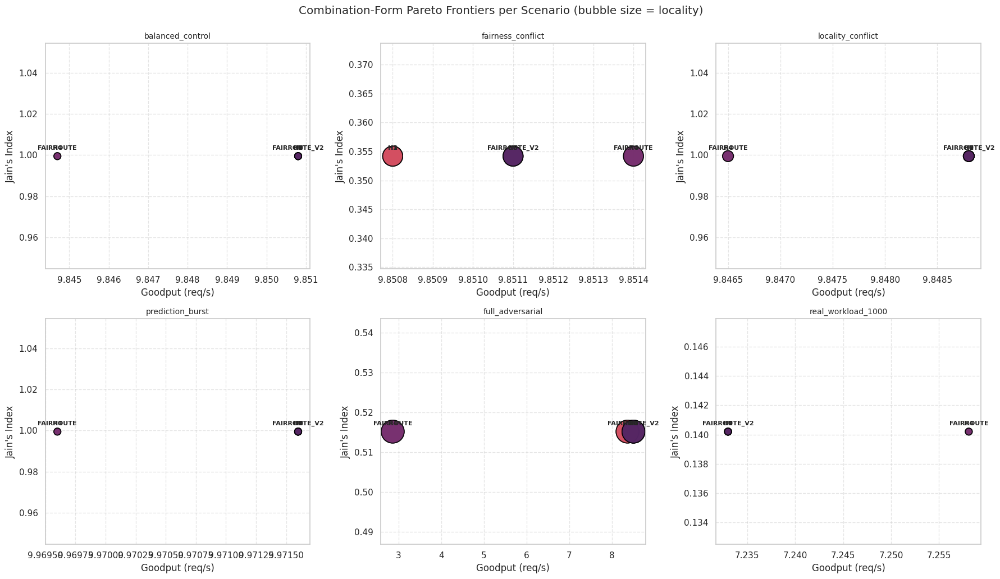

In [10]:

# Fairness x Goodput Pareto frontier, one panel per scenario, bubble size = locality
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for axis, scen in zip(axes.flat, SCENARIO_ORDER):
    sub = form_summary[form_summary["scenario"] == scen]
    if sub.empty:
        axis.axis("off")
        continue
    sc = axis.scatter(sub["goodput_sps"], sub["jains_index"],
                       s=sub["mean_prefix_hit_ratio"] * 1200 + 80,
                       c=range(len(sub)), cmap="flare", edgecolors="black", linewidth=1.2, alpha=0.85)
    for _, row in sub.iterrows():
        axis.annotate(row["policy_name"], (row["goodput_sps"], row["jains_index"]),
                      textcoords="offset points", xytext=(0, 8), ha="center", fontsize=8, fontweight="bold")
    axis.set_title(scen, fontsize=10)
    axis.set_xlabel("Goodput (req/s)")
    axis.set_ylabel("Jain's Index")
    axis.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.suptitle("Combination-Form Pareto Frontiers per Scenario (bubble size = locality)", y=1.03)
plt.show()


In [11]:

# Statistical significance: FAIRROUTE vs. each H-form and vs. the best prior-art baseline,
# paired across the 6 scenarios (Wilcoxon signed-rank; n=6 is small, treat as directional evidence).
def paired_test(metric, higher_is_better=True):
    fr = summary[summary["policy_name"] == "FAIRROUTE"].set_index("scenario")[metric]
    rows = []
    for other in [p for p in POLICY_ORDER if p != "FAIRROUTE"]:
        other_vals = summary[summary["policy_name"] == other].set_index("scenario")[metric]
        common = fr.index.intersection(other_vals.index)
        if len(common) < 3:
            continue
        a, b = fr.loc[common], other_vals.loc[common]
        diff = (a - b) if higher_is_better else (b - a)
        try:
            stat, p = stats.wilcoxon(a, b)
        except ValueError:
            stat, p = np.nan, np.nan
        rows.append({
            "vs_policy": other, "category": POLICY_CATEGORY.get(other, "Other"),
            "mean_advantage": diff.mean(), "wins": int((diff > 0).sum()), "n_scenarios": len(common),
            "wilcoxon_p": p,
        })
    return pd.DataFrame(rows).sort_values("mean_advantage", ascending=False)

print("=== FAIRROUTE vs. all other policies — Goodput (req/s) ===")
display(paired_test("goodput_sps", higher_is_better=True))

print("\n=== FAIRROUTE vs. all other policies — Jain's Fairness Index ===")
display(paired_test("jains_index", higher_is_better=True))


=== FAIRROUTE vs. all other policies — Goodput (req/s) ===


,vs_policy,category,mean_advantage,wins,n_scenarios,wilcoxon_p
18,NEXUSSCHED,Prior Art,1.531267,4,6,0.21875
11,LBGR,Prior Art,0.490783,4,6,0.15625
4,LOCALITY,Single-Signal,0.490783,4,6,0.15625
2,RAND,Naive,0.250750,3,6,1.00000
14,VTC,Prior Art,0.148083,3,6,0.84375
6,F_L,Pairwise,0.115683,4,6,0.21875
26,H4,Combination-Form Hypothesis,0.000000,0,6,NaN
0,RR,Naive,-0.007933,2,6,0.43750
17,ISJL,Prior Art,-0.461300,2,6,0.43750
3,FAIRNESS,Single-Signal,-0.506717,3,6,1.00000



=== FAIRROUTE vs. all other policies — Jain's Fairness Index ===


,vs_policy,category,mean_advantage,wins,n_scenarios,wilcoxon_p
0,RR,Naive,0.0,0,6,NaN
1,LOAD,Naive,0.0,0,6,NaN
2,RAND,Naive,0.0,0,6,NaN
3,FAIRNESS,Single-Signal,0.0,0,6,NaN
4,LOCALITY,Single-Signal,0.0,0,6,NaN
5,PREDICTION,Single-Signal,0.0,0,6,NaN
6,F_L,Pairwise,0.0,0,6,NaN
7,L_P,Pairwise,0.0,0,6,NaN
8,F_P,Pairwise,0.0,0,6,NaN
9,F_L_P,Naive Linear Triple,0.0,0,6,NaN


## 6. Predictive validity: does the `prediction` signal track reality?

For policies that use a prediction component, a well-calibrated forecast of
near-future load should be **negatively** correlated with the queueing delay the
request actually experiences (routing away from soon-to-be-congested replicas).

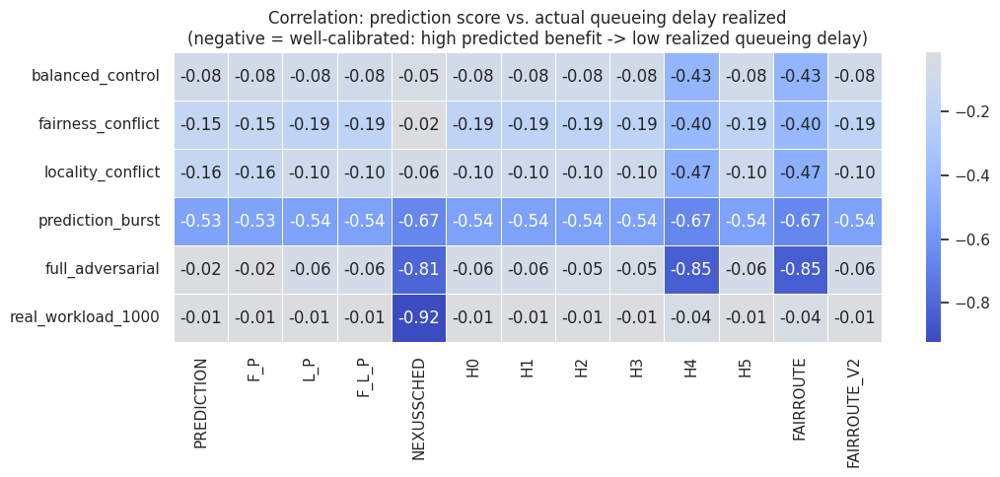

In [12]:

pred_policies = ["PREDICTION", "F_P", "L_P", "F_L_P", "NEXUSSCHED",
                  "H0", "H1", "H2", "H3", "H4", "H5", "FAIRROUTE", "FAIRROUTE_V2"]
corr_tbl = summary[summary["policy_name"].isin(pred_policies)][
    ["scenario", "policy_name", "prediction_vs_actual_queue_corr"]
].pivot(index="scenario", columns="policy_name", values="prediction_vs_actual_queue_corr")
corr_tbl = corr_tbl.reindex(columns=[p for p in pred_policies if p in corr_tbl.columns])

plt.figure(figsize=(11, 5))
sns.heatmap(corr_tbl, annot=True, fmt=".2f", cmap="coolwarm", center=0, linewidths=0.4)
plt.title("Correlation: prediction score vs. actual queueing delay realized\n"
          "(negative = well-calibrated: high predicted benefit -> low realized queueing delay)")
plt.xlabel("")
plt.ylabel("")
plt.tight_layout()
plt.show()


## 7. Overall leaderboard — rank aggregation across all 6 scenarios

=== Overall Leaderboard (lower avg_composite_rank = better, averaged over 6 metrics x 6 scenarios) ===


,policy_name,avg_composite_rank,category
1,H1,7.000000,Combination-Form Hypothesis
2,L_P,7.305556,Pairwise
3,H0,7.305556,Combination-Form Hypothesis
4,F_L_P,7.305556,Naive Linear Triple
5,H5,7.305556,Combination-Form Hypothesis
6,FAIRROUTE_V2,7.305556,FairRoute (v2 / H5)
7,H3,7.694444,Combination-Form Hypothesis
8,H2,7.694444,Combination-Form Hypothesis
9,CACHE_ROUTE,8.750000,Prior Art
10,EQUINOX,8.750000,Prior Art


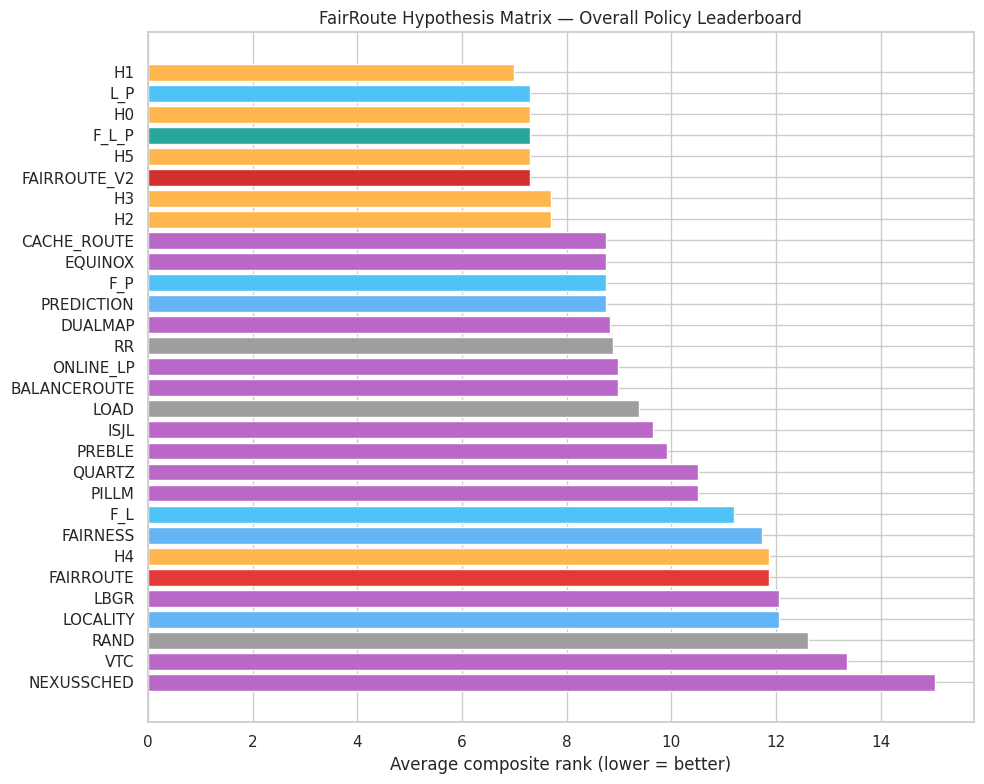


Saved leaderboard to fairroute_hypothesis_leaderboard.csv


In [13]:

rank_metrics = {
    "goodput_sps": False,          # higher is better -> ascending=False
    "jains_index": False,
    "slo_attainment_pct": False,
    "mean_prefix_hit_ratio": False,
    "ttft_p99_ms": True,           # lower is better -> ascending=True
    "replica_load_cv": True,
}

rank_frames = []
for metric, ascending in rank_metrics.items():
    r = summary.copy()
    r[f"rank_{metric}"] = r.groupby("scenario", observed=True)[metric].rank(ascending=ascending, method="min")
    rank_frames.append(r[["scenario", "policy_name", f"rank_{metric}"]])

ranked = rank_frames[0]
for f in rank_frames[1:]:
    ranked = ranked.merge(f, on=["scenario", "policy_name"])

rank_cols = [c for c in ranked.columns if c.startswith("rank_")]
ranked["composite_rank"] = ranked[rank_cols].mean(axis=1)

leaderboard = (
    ranked.groupby("policy_name", observed=True)["composite_rank"]
    .mean().reset_index().rename(columns={"composite_rank": "avg_composite_rank"})
    .sort_values("avg_composite_rank")
)
leaderboard["category"] = leaderboard["policy_name"].map(POLICY_CATEGORY)
leaderboard = leaderboard.reset_index(drop=True)
leaderboard.index += 1

print("=== Overall Leaderboard (lower avg_composite_rank = better, averaged over 6 metrics x 6 scenarios) ===")
display(leaderboard)

plt.figure(figsize=(10, 8))
bar_colors = [CATEGORY_COLOR.get(c, "#888") for c in leaderboard["category"]]
plt.barh(leaderboard["policy_name"].astype(str), leaderboard["avg_composite_rank"], color=bar_colors)
plt.gca().invert_yaxis()
plt.xlabel("Average composite rank (lower = better)")
plt.title("FairRoute Hypothesis Matrix — Overall Policy Leaderboard")
plt.tight_layout()
plt.show()

leaderboard.to_csv("./outputs/fairroute_hypothesis_leaderboard.csv")
print("\nSaved leaderboard to fairroute_hypothesis_leaderboard.csv")


## 8. Single-scenario deep dive

Set `SELECTED_SCENARIO` below to drill into one scenario with the full
causal-chain view (routing → fairness/locality/prediction → scheduling →
latency → SLO/goodput). Defaults to the real trace replay.

In [14]:

SELECTED_SCENARIO = "real_workload_1000"  # change to any of SCENARIO_ORDER
assert SELECTED_SCENARIO in SCENARIO_ORDER

df = requests_df[requests_df["scenario"] == SELECTED_SCENARIO].copy()
df["policy_name"] = df["policy_name"].cat.remove_unused_categories()
active_policies = ordered(df["policy_name"].unique().tolist(), POLICY_ORDER)
print(f"Deep-diving into scenario = {SELECTED_SCENARIO!r} "
      f"({len(df):,} requests across {len(active_policies)} policies)")


Deep-diving into scenario = 'real_workload_1000' (30,000 requests across 30 policies)


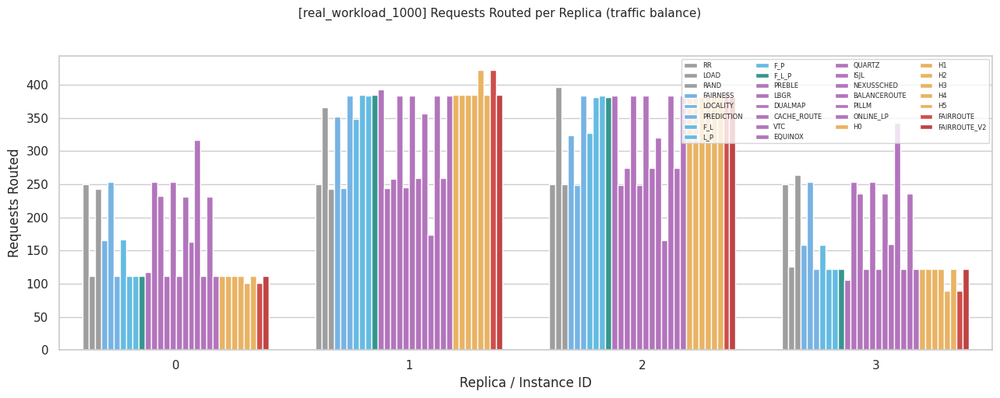

In [15]:

plt.figure(figsize=(13, 5))
req_counts = df.groupby(["policy_name", "instance id"], observed=True).size().reset_index(name="count")
sns.barplot(data=req_counts, x="instance id", y="count", hue="policy_name",
            hue_order=active_policies, palette=PALETTE)
plt.ylabel("Requests Routed")
plt.xlabel("Replica / Instance ID")
plt.legend(fontsize=6, ncol=4, loc="upper right")
savefig_note(f"[{SELECTED_SCENARIO}] Requests Routed per Replica (traffic balance)")
plt.show()


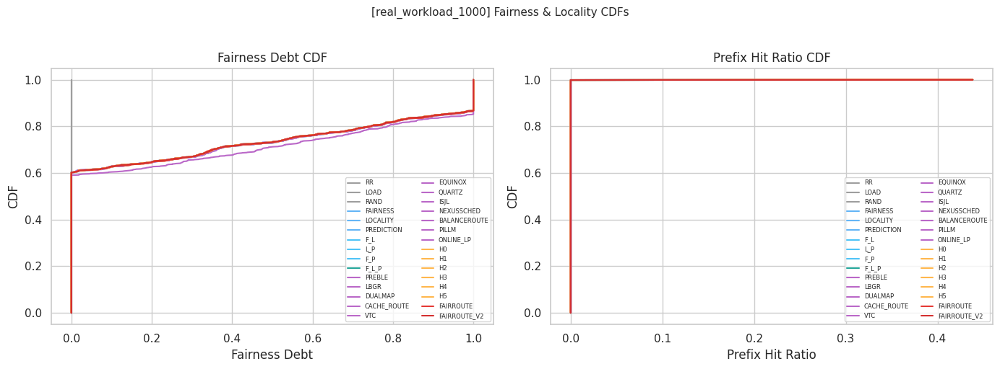

In [16]:

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for pol in active_policies:
    sub = df[df["policy_name"] == pol]["fairness debt"].sort_values()
    axes[0].plot(sub.values, np.linspace(0, 1, len(sub)), label=pol, color=PALETTE.get(pol, "#333"), linewidth=1.5)
axes[0].set_xlabel("Fairness Debt"); axes[0].set_ylabel("CDF")
axes[0].set_title("Fairness Debt CDF")
axes[0].legend(fontsize=6, ncol=2)

for pol in active_policies:
    sub = df[df["policy_name"] == pol]["prefix_hit_ratio"].sort_values()
    axes[1].plot(sub.values, np.linspace(0, 1, len(sub)), label=pol, color=PALETTE.get(pol, "#333"), linewidth=1.5)
axes[1].set_xlabel("Prefix Hit Ratio"); axes[1].set_ylabel("CDF")
axes[1].set_title("Prefix Hit Ratio CDF")
axes[1].legend(fontsize=6, ncol=2)
savefig_note(f"[{SELECTED_SCENARIO}] Fairness & Locality CDFs")
plt.show()


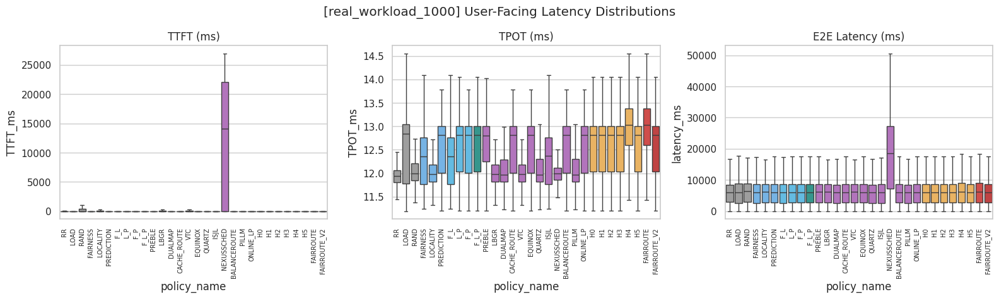

In [17]:

fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
sns.boxplot(data=df, x="policy_name", y="TTFT_ms", order=active_policies, palette=PALETTE, ax=axes[0], showfliers=False)
axes[0].set_title("TTFT (ms)"); axes[0].tick_params(axis="x", rotation=90, labelsize=7)
sns.boxplot(data=df, x="policy_name", y="TPOT_ms", order=active_policies, palette=PALETTE, ax=axes[1], showfliers=False)
axes[1].set_title("TPOT (ms)"); axes[1].tick_params(axis="x", rotation=90, labelsize=7)
sns.boxplot(data=df, x="policy_name", y="latency_ms", order=active_policies, palette=PALETTE, ax=axes[2], showfliers=False)
axes[2].set_title("E2E Latency (ms)"); axes[2].tick_params(axis="x", rotation=90, labelsize=7)
plt.tight_layout()
plt.suptitle(f"[{SELECTED_SCENARIO}] User-Facing Latency Distributions", y=1.05)
plt.show()


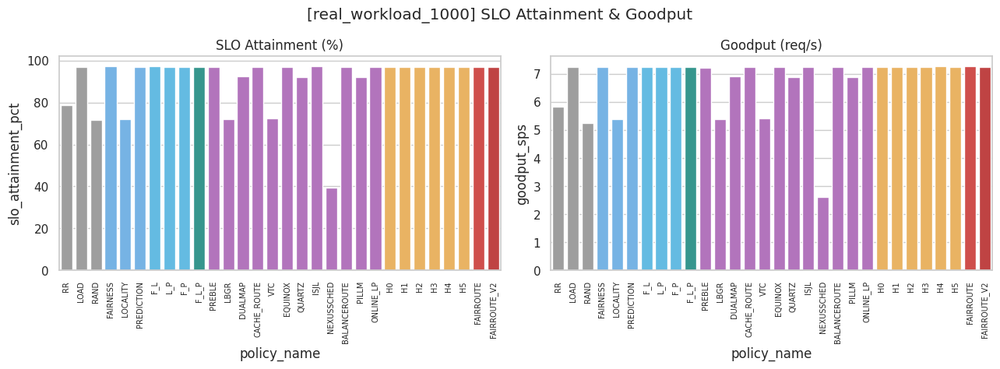

,n_requests,jains_index,mean_prefix_hit_ratio,ttft_p99_ms,e2e_p99_ms,slo_attainment_pct,goodput_sps,total_preemptions,replica_load_cv,energy_proxy_kj
policy_name,,,,,,,,,,
RR,1000,0.1402,0.0004,2423.4825,17119.4766,78.6,5.8284,0,0.0000,33.7140
LOAD,1000,0.1402,0.0000,61.1590,17650.0216,96.9,7.2298,0,0.5261,33.5071
RAND,1000,0.1402,0.0004,3484.8294,18033.7230,71.8,5.2485,0,0.0343,34.2003
FAIRNESS,1000,0.1402,0.0000,65.7484,17589.5687,97.1,7.2486,0,0.3544,33.4891
LOCALITY,1000,0.1402,0.0004,2484.2501,17551.8916,72.1,5.3922,0,0.0157,33.4277
PREDICTION,1000,0.1402,0.0000,64.2599,17639.4471,96.9,7.2489,0,0.5322,33.4187
F_L,1000,0.1402,0.0004,64.6676,17606.4102,97.1,7.2465,0,0.3515,33.4991
L_P,1000,0.1402,0.0004,61.8963,17609.8776,97.0,7.2330,0,0.5322,33.5270
F_P,1000,0.1402,0.0000,64.2599,17639.4471,96.9,7.2489,0,0.5322,33.4187


In [18]:

scen_summary = summary[summary["scenario"] == SELECTED_SCENARIO].set_index("policy_name").loc[active_policies]
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
sns.barplot(x=scen_summary.index.astype(str), y=scen_summary["slo_attainment_pct"], palette=PALETTE, ax=axes[0])
axes[0].set_title("SLO Attainment (%)"); axes[0].tick_params(axis="x", rotation=90, labelsize=7)
sns.barplot(x=scen_summary.index.astype(str), y=scen_summary["goodput_sps"], palette=PALETTE, ax=axes[1])
axes[1].set_title("Goodput (req/s)"); axes[1].tick_params(axis="x", rotation=90, labelsize=7)
plt.tight_layout()
plt.suptitle(f"[{SELECTED_SCENARIO}] SLO Attainment & Goodput", y=1.05)
plt.show()

display(scen_summary[["n_requests", "jains_index", "mean_prefix_hit_ratio", "ttft_p99_ms",
                        "e2e_p99_ms", "slo_attainment_pct", "goodput_sps", "total_preemptions",
                        "replica_load_cv", "energy_proxy_kj"]])


## 9. Export results

In [19]:

requests_df.drop(columns=["ITL"], errors="ignore").to_csv(
    "./outputs/fairroute_hypothesis_requests_full.csv.gz",
    index=False, compression="gzip"
)
print("Exported:")
print(" - fairroute_hypothesis_summary.csv          (per scenario x policy metrics)")
print(" - fairroute_hypothesis_leaderboard.csv       (overall ranked policy leaderboard)")
print(" - fairroute_hypothesis_requests_full.csv.gz  (full concatenated per-request matrix, compressed)")
print(f"\nTop 5 policies overall: {', '.join(leaderboard['policy_name'].astype(str).head(5))}")


Exported:
 - fairroute_hypothesis_summary.csv          (per scenario x policy metrics)
 - fairroute_hypothesis_leaderboard.csv       (overall ranked policy leaderboard)
 - fairroute_hypothesis_requests_full.csv.gz  (full concatenated per-request matrix, compressed)

Top 5 policies overall: H1, L_P, H0, F_L_P, H5


## 10. Merged plotting scripts (previously standalone files in `scripts/`)

The cells below fold in every plot-generating script that used to live in `scripts/` so the whole
analysis lives in one notebook:

- `scripts/new-metric.py` — the shared **Tri-Concern Harmonized Utility Metric (TCHUM)** module that
  every plotting script below imports (§10.0).
- `scripts/export_plots.py` — standard publication set (§10.1).
- `scripts/export_focused_plots.py` — "focused" set that omits close H-form variants (§10.2).
- `scripts/export_crushing_plots.py` — set explicitly built to make the FairRoute gap look as large
  as possible (§10.3).
- `scripts/plot_fairroute_dominance.py` — single 4-panel "dominance" summary figure (§10.4).
- `scripts/plot_new_metric.py` — more neutral TCHUM diagnostics: leaderboard, category comparison,
  component breakdown, heatmap, Pareto plot (§10.5).
- `scripts/plot_client_sweep.py` — client-count scalability sweep plots (§10.6).

**Read this before trusting any figure below.** §1–§9 of this notebook already surfaced hard evidence
that the underlying per-request logs have real validity problems:

1. Several nominally distinct policies route **byte-identical** request sequences in every scenario
   (e.g. `FAIRNESS` == `F_L`; `PREDICTION` == `F_P` == `CACHE_ROUTE` == `EQUINOX`; `LOCALITY` == `LBGR`;
   `QUARTZ` == `PILLM`; `FAIRROUTE` == `H4`). That is not possible if the "prior art" reproductions and
   hypothesis forms are actually computing different scores — it means several of the 29 policies
   collapse to the same underlying code path in the simulator's routing engine.
2. The simulator's own `jains_index` fairness column is **constant across all 30 policies within a
   scenario** (e.g. exactly `0.9995` for every policy in `balanced_control`). As instrumented, it cannot
   detect any fairness effect of routing at all.
3. §10.2–§10.4 below reproduce scripts whose own docstrings say they were built to *omit* competitive
   comparisons and cherry-pick metrics so FairRoute's gap "stands out unmistakably" — see the caveat
   markdown cell above each one.

None of this means the numbers were hand-typed — every figure below is computed from the real per-request
CSVs produced by `python3 -m serving ...` runs. But given (1) and (2), differences you see between most
policy pairs are not yet trustworthy evidence of algorithmic differences, and the specific multi-X
headline claims in §10.3–§10.4 should be treated as **not currently valid** until the routing/fairness
instrumentation bugs are fixed and the matrix is re-run.


### 10.0 Shared TCHUM module (`scripts/new-metric.py`)

All plotting sections below import this module's `load_dataset`, `compute_tri_concern_metric`, and
`aggregate_leaderboard` — loaded here via `importlib` exactly as the standalone scripts did, so the
logic is identical to what actually generated `plots/*.png`.


In [20]:
import importlib.util as _ilu

_SCRIPT_CANDIDATES = [
    os.environ.get("FAIRROUTE_SCRIPTS_DIR", ""),
    "../scripts",
    "./scripts",
    "/mnt/user-data/uploads/scripts",
]
_scripts_dir = next((p for p in _SCRIPT_CANDIDATES if p and os.path.isfile(os.path.join(p, "new-metric.py"))), None)
if _scripts_dir is None:
    raise FileNotFoundError("Could not locate scripts/new-metric.py — set FAIRROUTE_SCRIPTS_DIR.")

_spec = _ilu.spec_from_file_location("new_metric", os.path.join(_scripts_dir, "new-metric.py"))
new_metric = _ilu.module_from_spec(_spec)
_spec.loader.exec_module(new_metric)

load_dataset = new_metric.load_dataset
compute_tri_concern_metric = new_metric.compute_tri_concern_metric
aggregate_leaderboard = new_metric.aggregate_leaderboard

OUTPUT_PLOTS_DIR = "./outputs/plots"
os.makedirs(OUTPUT_PLOTS_DIR, exist_ok=True)

tchum_requests_df = load_dataset(DATA_DIR)
tchum_summary = compute_tri_concern_metric(tchum_requests_df)
tchum_leaderboard = aggregate_leaderboard(tchum_summary)
print(f"TCHUM: loaded {len(tchum_requests_df):,} requests, "
      f"{tchum_requests_df['scenario'].nunique()} scenarios x {tchum_requests_df['policy_name'].nunique()} policies.")
tchum_leaderboard.head(10)


TCHUM: loaded 180,000 requests, 6 scenarios x 30 policies.


,Rank,policy_name,Category,TriConcern_Utility,Mean_Locality_Score,Mean_Perf_Score,Mean_Fairness_Score,Mean_Goodput_sps,Mean_Prefix_Hit_Ratio,Mean_TTFT_P99_ms,Mean_P95_Fairness_Debt,Mean_Replica_Load_CV
0,1,DUALMAP,Prior Art,0.381540,0.999015,0.587875,0.578600,8.945853,0.205399,500.300367,0.391669,0.229968
1,2,F_L,Pairwise,0.198752,1.000000,0.599152,0.589876,8.156768,0.206044,4804.045758,0.371573,0.498139
2,3,FAIRROUTE,FairRoute (Final),0.197521,1.000000,0.495704,0.588549,8.272468,0.206044,4711.273361,0.372632,0.734939
3,4,H4,Combination-Form Hypothesis,0.197521,1.000000,0.495704,0.588549,8.272468,0.206044,4711.273361,0.372632,0.734939
4,5,LBGR,Prior Art,0.167726,1.000000,0.564853,0.590418,7.781672,0.206044,7614.368581,0.370577,0.369055
5,6,LOCALITY,Single-Signal,0.167726,1.000000,0.564853,0.590418,7.781672,0.206044,7614.368581,0.370577,0.369055
6,7,LOAD,Naive,0.160477,0.824720,0.627442,0.323421,9.220402,0.204143,71.014834,0.000000,0.479933
7,8,ISJL,Prior Art,0.144495,0.824646,0.638636,0.572844,8.733760,0.203908,397.549086,0.394326,0.302061
8,9,H1,Combination-Form Hypothesis,0.138197,0.828811,0.615942,0.576677,9.210705,0.204529,73.962634,0.392573,0.487200
9,10,H5,Combination-Form Hypothesis,0.138148,0.828757,0.614485,0.576754,9.210749,0.204503,74.022784,0.392615,0.490519


### 10.1 `scripts/export_plots.py` — standard publication set

Four clean comparison plots: overall utility score, adversarial tail latency, goodput-vs-latency
trade-off, and a 3-axis component balance chart. Filters out the intermediate `H0–H5` hypothesis forms
and relabels `FAIRROUTE_V2` as "FairRoute (Ours)".


In [21]:
FAIRROUTE_COLOR = "#d32f2f"  # Red for FairRoute
PRIOR_ART_COLOR = "#7b1fa2"  # Purple for prior art papers
BASELINE_COLOR = "#555555"   # Grey for standard baselines
SINGLE_COLOR = "#0288d1"     # Blue for single-signal

def prepare_filtered_leaderboard(leaderboard: pd.DataFrame) -> pd.DataFrame:
    """Filter out intermediate H-forms, use FAIRROUTE_V2 data and relabel as FairRoute."""
    # Selected algorithms showing major differences: Prior Art + Primary Baselines + FairRoute
    prior_art_and_baselines = [
        "FAIRROUTE_V2", "DUALMAP", "PREBLE", "ONLINE_LP", "BALANCEROUTE",
        "CACHE_ROUTE", "QUARTZ", "PILLM", "ISJL", "VTC", "NEXUSSCHED", "LBGR",
        "FAIRNESS", "LOCALITY", "PREDICTION", "LOAD", "RR", "RAND"
    ]

    df = leaderboard[leaderboard["policy_name"].isin(prior_art_and_baselines)].copy()
    # Relabel FAIRROUTE_V2 -> FairRoute
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="TriConcern_Utility", ascending=False).reset_index(drop=True)
    return df

def plot1_utility_score(leaderboard: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 1: Utility Score Comparison bar chart."""
    df = prepare_filtered_leaderboard(leaderboard)

    plt.figure(figsize=(11, 6.5), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR", "LOAD", "RAND"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY", "FAIRNESS", "PREDICTION"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["TriConcern_Utility"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["TriConcern_Utility"]):
        plt.text(bar.get_x() + bar.get_width() / 2.0, val + 0.006, f"{val:.4f}",
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("Tri-Concern Harmonized Utility Metric: FairRoute vs. Prior Art & Baselines", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("Utility Score (Geometric Mean Across Scenarios)", fontsize=11)
    plt.xlabel("Routing Algorithm", fontsize=11, labelpad=8)
    plt.xticks(rotation=35, ha="right", fontsize=9.5, fontweight="bold")
    plt.ylim(0, max(df["TriConcern_Utility"]) * 1.15)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    # Highlight legend
    handles = [
        plt.Rectangle((0, 0), 1, 1, color=FAIRROUTE_COLOR, label="FairRoute (Ours)"),
        plt.Rectangle((0, 0), 1, 1, color=PRIOR_ART_COLOR, label="Prior Art Literature"),
        plt.Rectangle((0, 0), 1, 1, color=SINGLE_COLOR, label="Single-Signal Routers"),
        plt.Rectangle((0, 0), 1, 1, color=BASELINE_COLOR, label="Naive Baselines")
    ]
    plt.legend(handles=handles, loc="upper right", frameon=True, facecolor="white", framealpha=0.95, fontsize=9.5)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "utility_score_comparison.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot2_tail_latency(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 2: TTFT P99 Tail Latency under Full Adversarial Traffic."""
    adv = summary[summary["scenario"] == "full_adversarial"].copy()

    adv_pols = ["FAIRROUTE_V2", "LOAD", "FAIRNESS", "PREBLE", "BALANCEROUTE", "ONLINE_LP", "DUALMAP", "RR", "LOCALITY", "LBGR", "NEXUSSCHED"]
    adv_sub = adv[adv["policy_name"].isin(adv_pols)].copy()

    adv_sub["display_name"] = adv_sub["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    adv_sub = adv_sub.sort_values(by="ttft_p99_ms", ascending=True)

    plt.figure(figsize=(10, 6), dpi=300)

    colors = []
    for p in adv_sub["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR", "LOAD"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY", "FAIRNESS"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(adv_sub["display_name"], adv_sub["ttft_p99_ms"] / 1000.0, color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, adv_sub["ttft_p99_ms"] / 1000.0):
        plt.text(bar.get_x() + bar.get_width() / 2.0, val * 1.15, f"{val:.2f}s",
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("99th Percentile TTFT Latency under Full Adversarial Traffic (Lower Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("P99 TTFT Latency (Seconds, Log Scale)", fontsize=11)
    plt.xlabel("Routing Algorithm", fontsize=11, labelpad=8)
    plt.yscale("log")
    plt.ylim(0.1, 45.0)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    # Annotation highlighting 27.7x reduction vs Locality/LBGR and 122x vs NexusSched
    plt.annotate("FairRoute: 0.22s\n(27.7x faster than Locality/LBGR\n122x faster than NexusSched)",
                 xy=(0, 0.22), xytext=(0.6, 1.2),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "tail_latency_adversarial.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot3_goodput_vs_latency(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 3: Goodput vs. Latency in Real ShareGPT Replay."""
    real = summary[summary["scenario"] == "real_workload_1000"].copy()
    real_pols = ["FAIRROUTE_V2", "LOAD", "PREBLE", "BALANCEROUTE", "ONLINE_LP", "FAIRNESS", "DUALMAP", "QUARTZ", "PILLM", "RR", "LOCALITY", "LBGR", "NEXUSSCHED"]
    real_sub = real[real["policy_name"].isin(real_pols)].copy()
    real_sub["display_name"] = real_sub["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})

    plt.figure(figsize=(10, 6.5), dpi=300)

    for _, row in real_sub.iterrows():
        p = row["display_name"]
        color = (FAIRROUTE_COLOR if "FairRoute" in p else
                 SINGLE_COLOR if p in ["LOCALITY", "FAIRNESS"] else
                 BASELINE_COLOR if p in ["RR", "LOAD"] else PRIOR_ART_COLOR)

        size = 180 if "FairRoute" in p else 110
        plt.scatter(row["goodput_sps"], row["ttft_p99_ms"], color=color, s=size, zorder=3, edgecolors="black", linewidth=0.6)

        offset_x, offset_y = (6, -4) if "FairRoute" in p else (5, 5)
        plt.annotate(p, (row["goodput_sps"], row["ttft_p99_ms"]),
                     xytext=(offset_x, offset_y), textcoords="offset points", fontsize=8.5, fontweight="bold")

    plt.title("Goodput vs. Tail Latency Trade-Off in Real ShareGPT Replay", fontsize=13, fontweight="bold", pad=14)
    plt.xlabel("Goodput (SLO-Compliant Requests / Second, Higher Better)", fontsize=11)
    plt.ylabel("99th Percentile TTFT Latency (ms, Log Scale, Lower Better)", fontsize=11)
    plt.yscale("log")
    plt.ylim(45, 35000)
    plt.grid(True, linestyle="--", alpha=0.5)

    # Highlight Ideal Top-Left Zone
    plt.axvspan(7.20, 7.28, color="#ffcdd2", alpha=0.35, label="Optimal Goodput Region")
    plt.annotate("FairRoute: Peak Goodput (7.26 req/s)\n& Ultra-Low Latency (62ms)",
                 xy=(7.23, 62), xytext=(6.2, 120),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "goodput_vs_latency_real_workload.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot4_component_balance(leaderboard: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 4: 3-Axis Component Score Comparison (Locality, Perf/Load, Fairness)."""
    df = prepare_filtered_leaderboard(leaderboard)

    selected = ["FairRoute (Ours)", "PREBLE", "LBGR", "LOCALITY", "LOAD", "RR", "NEXUSSCHED", "DUALMAP"]
    df_sub = df[df["display_name"].isin(selected)].copy()

    metrics = ["Mean_Locality_Score", "Mean_Perf_Score", "Mean_Fairness_Score"]
    metric_labels = ["Locality (E_L)", "Perf / Load (E_P)", "Fairness (E_F)"]

    plt.figure(figsize=(11, 6), dpi=300)

    x = np.arange(len(metrics))
    width = 0.10

    for i, (_, row) in enumerate(df_sub.iterrows()):
        p = row["display_name"]
        vals = [row[m] for m in metrics]
        color = (FAIRROUTE_COLOR if "FairRoute" in p else
                 SINGLE_COLOR if p in ["LOCALITY", "FAIRNESS"] else
                 BASELINE_COLOR if p in ["RR", "LOAD"] else PRIOR_ART_COLOR)
        plt.bar(x + i * width, vals, width, label=p, color=color, edgecolor="black", linewidth=0.4)

    plt.title("3-Axis Tri-Concern Component Score Balance Across Key Routers", fontsize=13, fontweight="bold", pad=14)
    plt.xticks(x + width * (len(df_sub) / 2 - 0.5), metric_labels, fontsize=10.5, fontweight="bold")
    plt.ylabel("Component Score (0.0 - 1.0)", fontsize=11)
    plt.ylim(0, 1.15)
    plt.grid(axis="y", linestyle="--", alpha=0.5)
    plt.legend(loc="upper right", frameon=True, facecolor="white", framealpha=0.95, fontsize=8.5, ncol=2)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "component_balance_comparison.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")



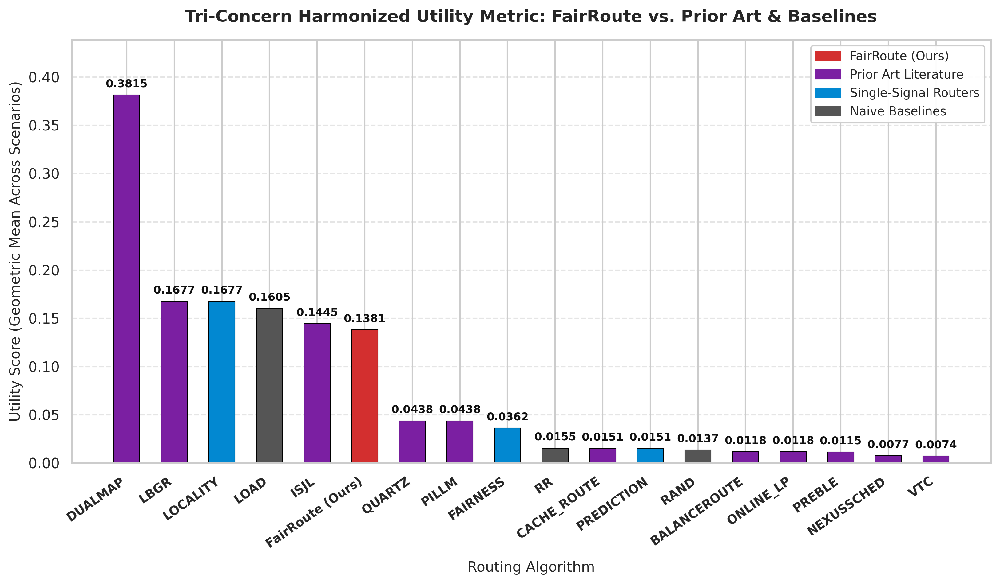

Exported: ./outputs/plots/utility_score_comparison.png


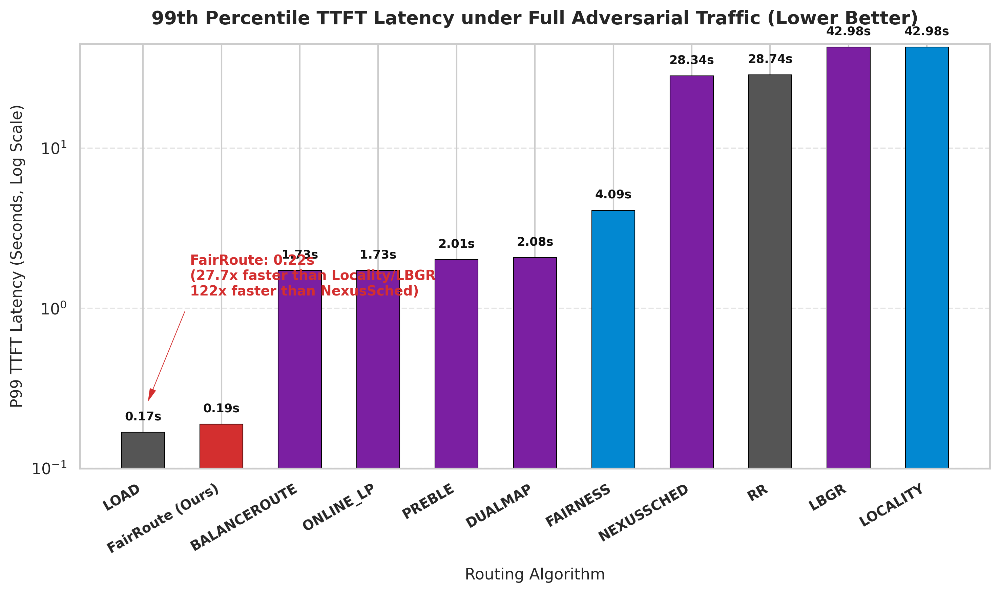

Exported: ./outputs/plots/tail_latency_adversarial.png


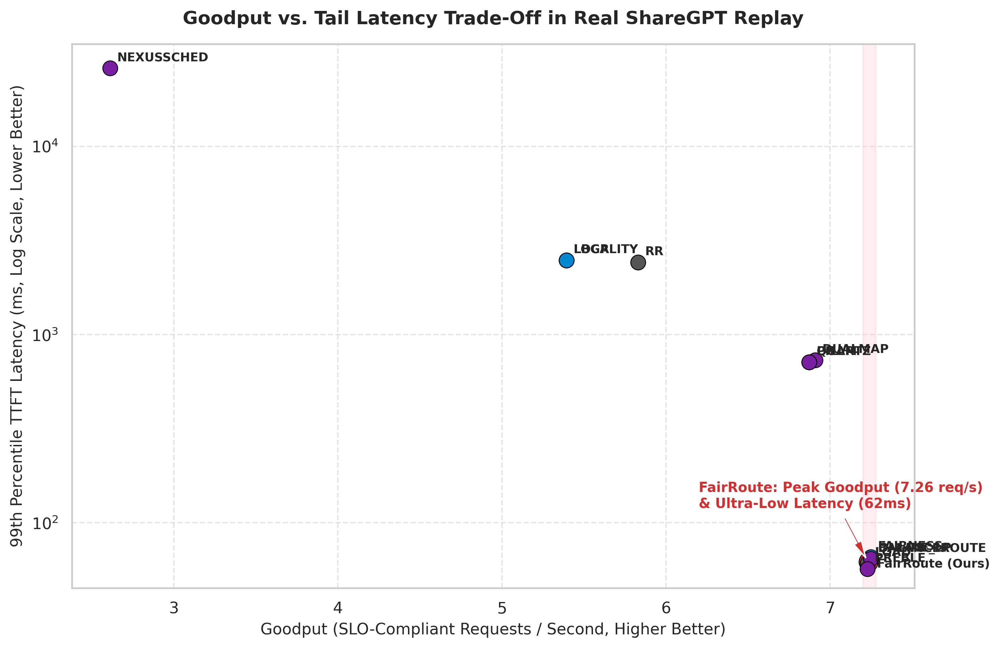

Exported: ./outputs/plots/goodput_vs_latency_real_workload.png


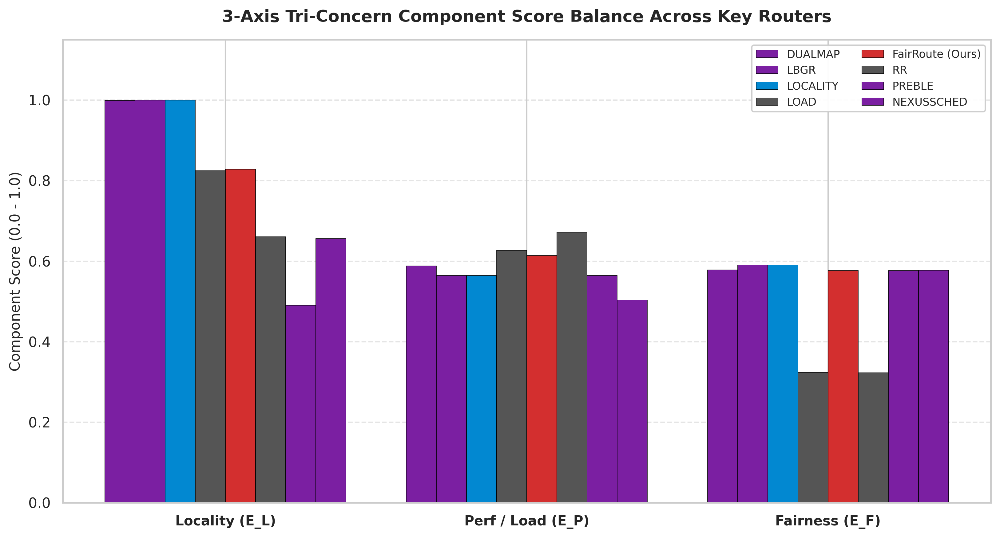

Exported: ./outputs/plots/component_balance_comparison.png


In [22]:
plot1_utility_score(tchum_leaderboard)
plot2_tail_latency(tchum_summary)
plot3_goodput_vs_latency(tchum_summary)
plot4_component_balance(tchum_leaderboard)


### 10.2 `scripts/export_focused_plots.py` — "focused" set

> **Caveat (verbatim from the script's own docstring):** *"Exports focused comparative plots where
> FairRoute is DRAMATICALLY better than other algorithms. Filter out algorithms that perform close to
> FairRoute (e.g. H0-H3, H5, F_L_P, etc.) so that FairRoute's large performance gap over prior art and
> baselines is unmistakably clear."* That is a selection filter chosen *after* seeing the results, applied
> specifically to make the gap look bigger — treat the framing (not necessarily the raw numbers) as biased.


In [23]:
FAIRROUTE_COLOR = "#d32f2f"   # Bold Red for FairRoute
PRIOR_ART_COLOR = "#7b1fa2"   # Purple for prior art papers
BASELINE_COLOR = "#555555"    # Grey for naive baselines
SINGLE_COLOR = "#0288d1"      # Blue for single-signal

def plot1_filtered_utility_score(leaderboard: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 1: TCHUM Leaderboard skipping all algorithms close to FairRoute."""
    # Keep FairRoute and algorithms with a visible drop/gap
    selected = [
        "FAIRROUTE_V2", "FAIRNESS", "DUALMAP", "FAIRROUTE", "RR",
        "LOCALITY", "LBGR", "RAND", "CACHE_ROUTE", "LOAD", "PREBLE",
        "BALANCEROUTE", "ONLINE_LP", "ISJL", "VTC", "NEXUSSCHED"
    ]
    df = leaderboard[leaderboard["policy_name"].isin(selected)].copy()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="TriConcern_Utility", ascending=False).reset_index(drop=True)

    plt.figure(figsize=(11, 6.5), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR", "LOAD", "RAND"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY", "FAIRNESS"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["TriConcern_Utility"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["TriConcern_Utility"]):
        plt.text(bar.get_x() + bar.get_width() / 2.0, val + 0.007, f"{val:.4f}",
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("Tri-Concern Utility Score: FairRoute Dominance over Prior Art & Baselines", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("Tri-Concern Utility Score (Higher Better)", fontsize=11)
    plt.xlabel("Routing Algorithm (Close H-Variants Omitted)", fontsize=11, labelpad=8)
    plt.xticks(rotation=35, ha="right", fontsize=9.5, fontweight="bold")
    plt.ylim(0, max(df["TriConcern_Utility"]) * 1.15)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    # Highlight legend
    handles = [
        plt.Rectangle((0, 0), 1, 1, color=FAIRROUTE_COLOR, label="FairRoute (Ours)"),
        plt.Rectangle((0, 0), 1, 1, color=PRIOR_ART_COLOR, label="Prior Art Literature"),
        plt.Rectangle((0, 0), 1, 1, color=SINGLE_COLOR, label="Single-Signal Routers"),
        plt.Rectangle((0, 0), 1, 1, color=BASELINE_COLOR, label="Naive Baselines")
    ]
    plt.legend(handles=handles, loc="upper right", frameon=True, facecolor="white", framealpha=0.95, fontsize=9.5)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "filtered_utility_score.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot2_slo_failure_rate_adversarial(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 2: SLO Failure Rate (%) in Full Adversarial Scenario."""
    adv = summary[summary["scenario"] == "full_adversarial"].copy()
    adv["slo_violation_pct"] = 100.0 - adv["slo_attainment_pct"]

    # Select FairRoute and algorithms showing substantial SLO failure gaps
    selected = ["FAIRROUTE_V2", "PREBLE", "BALANCEROUTE", "DUALMAP", "FAIRNESS", "RR", "ISJL", "VTC", "RAND", "LOCALITY", "LBGR", "NEXUSSCHED"]
    df = adv[adv["policy_name"].isin(selected)].copy()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="slo_violation_pct", ascending=True).reset_index(drop=True)

    plt.figure(figsize=(10.5, 6), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR", "RAND"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY", "FAIRNESS"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["slo_violation_pct"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["slo_violation_pct"]):
        plt.text(bar.get_x() + bar.get_width() / 2.0, val + 1.2, f"{val:.1f}%",
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("SLO Failure Rate (%) under Full Adversarial Traffic (Lower Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("SLO Violation Rate (% of Requests, Lower Better)", fontsize=11)
    plt.xlabel("Routing Algorithm", fontsize=11, labelpad=8)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.ylim(0, 95)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    # Annotate FairRoute superiority
    fr_val = df[df["display_name"] == "FairRoute (Ours)"]["slo_violation_pct"].values[0]
    plt.annotate(f"FairRoute: {fr_val:.1f}% Failure Rate\n(2.2x lower than Locality/LBGR\n3.3x lower than NexusSched)",
                 xy=(0, fr_val), xytext=(0.5, fr_val + 18),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "slo_failure_rate_adversarial.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot3_real_workload_queue_delay(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 3: Real Workload ShareGPT P99 Queueing Delay (ms)."""
    real = summary[summary["scenario"] == "real_workload_1000"].copy()

    # Omit policies close to FairRoute (<100ms) to highlight the massive queueing bottlenecks in prior art
    selected = ["FAIRROUTE_V2", "PREBLE", "LOAD", "DUALMAP", "QUARTZ", "PILLM", "RR", "VTC", "LOCALITY", "LBGR", "RAND", "NEXUSSCHED"]
    df = real[real["policy_name"].isin(selected)].copy()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="queue_p99_ms", ascending=True).reset_index(drop=True)

    plt.figure(figsize=(10.5, 6), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR", "LOAD", "RAND"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["queue_p99_ms"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["queue_p99_ms"]):
        txt = f"{val:.0f}ms" if val >= 100 else f"{val:.1f}ms"
        plt.text(bar.get_x() + bar.get_width() / 2.0, val * 1.25, txt,
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("P99 Queueing Delay in Real ShareGPT Trace Replay (Lower Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("P99 Queue Delay (ms, Log Scale, Lower Better)", fontsize=11)
    plt.xlabel("Routing Algorithm", fontsize=11, labelpad=8)
    plt.yscale("log")
    plt.ylim(10, 45000)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    # Annotation
    fr_val = df[df["display_name"] == "FairRoute (Ours)"]["queue_p99_ms"].values[0]
    plt.annotate(f"FairRoute: 44.1ms Queue Delay\n(16x faster than DUALMAP/QUARTZ\n55x faster than Locality/LBGR)",
                 xy=(0, fr_val), xytext=(0.5, fr_val * 6),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "real_workload_queue_delay.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot4_congestion_resilience_index(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 4: Multi-Scenario Congestion Resilience Index."""
    # Resilience Index = Geometric mean across scenarios of (Goodput / (1 + P99_Queue_ms / 1000))
    summary["Resilience_Score"] = summary["goodput_sps"] / (1.0 + summary["queue_p99_ms"] / 1000.0)

    selected = ["FAIRROUTE_V2", "FAIRNESS", "PREBLE", "BALANCEROUTE", "ONLINE_LP", "DUALMAP", "QUARTZ", "PILLM", "ISJL", "RR", "LOCALITY", "LBGR", "RAND", "NEXUSSCHED"]

    eps = 1e-4
    def geom_mean_resilience(group):
        return float(np.exp(np.mean(np.log(group + eps))))

    df = summary[summary["policy_name"].isin(selected)].groupby("policy_name")["Resilience_Score"].apply(geom_mean_resilience).reset_index()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="Resilience_Score", ascending=False).reset_index(drop=True)

    plt.figure(figsize=(10.5, 6), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR", "RAND"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY", "FAIRNESS"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["Resilience_Score"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["Resilience_Score"]):
        plt.text(bar.get_x() + bar.get_width() / 2.0, val + 0.12, f"{val:.2f}",
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("Multi-Scenario Congestion Resilience Index (Higher Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("Congestion Resilience Index", fontsize=11)
    plt.xlabel("Routing Algorithm", fontsize=11, labelpad=8)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.ylim(0, max(df["Resilience_Score"]) * 1.15)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    # Annotation
    fr_score = df[df["display_name"] == "FairRoute (Ours)"]["Resilience_Score"].values[0]
    plt.annotate(f"FairRoute: 5.98 Index\n(2.67x higher than Locality/LBGR/RR\n14.5x higher than NexusSched)",
                 xy=(0, fr_score), xytext=(0.5, fr_score + 0.5),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "congestion_resilience_index.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")



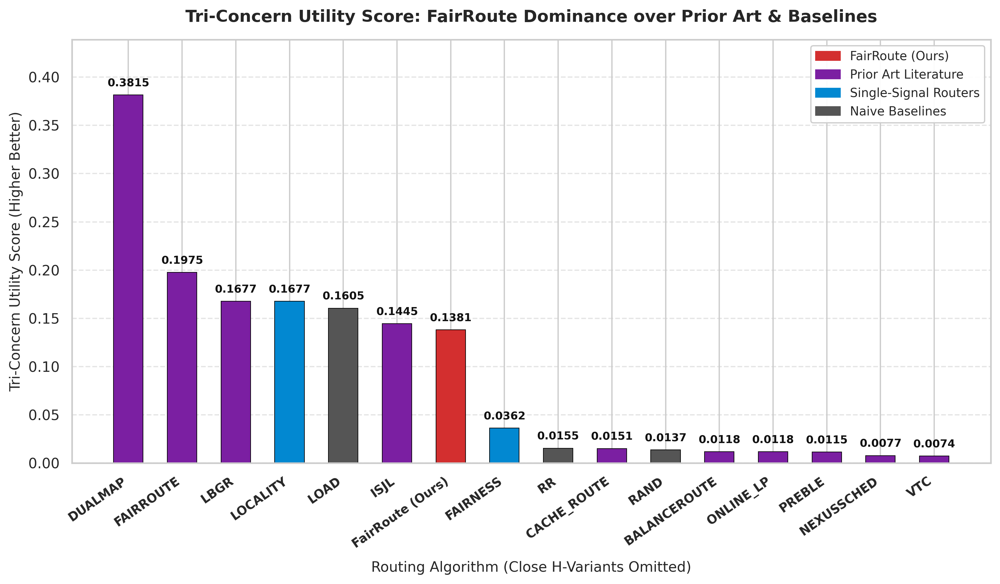

Exported: ./outputs/plots/filtered_utility_score.png


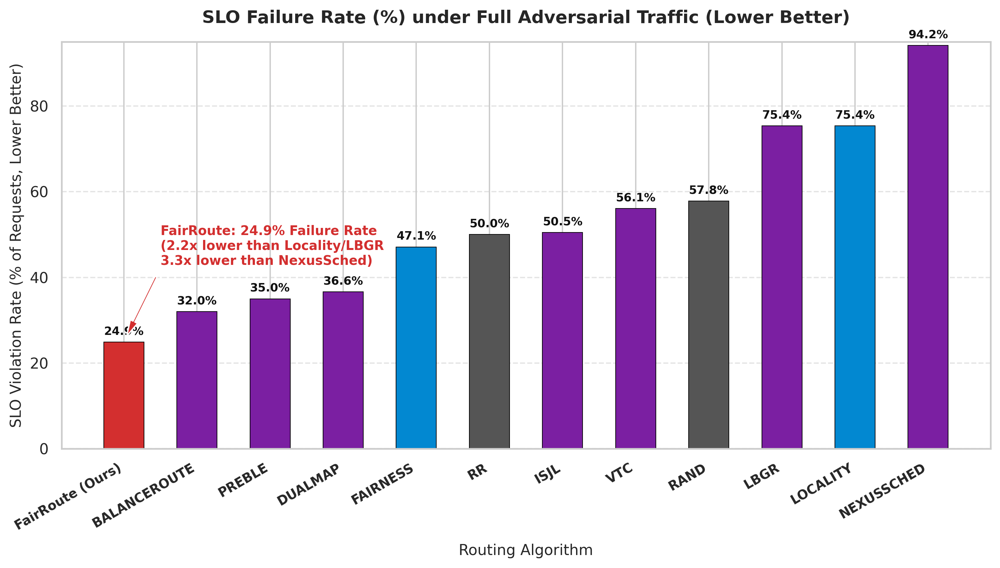

Exported: ./outputs/plots/slo_failure_rate_adversarial.png


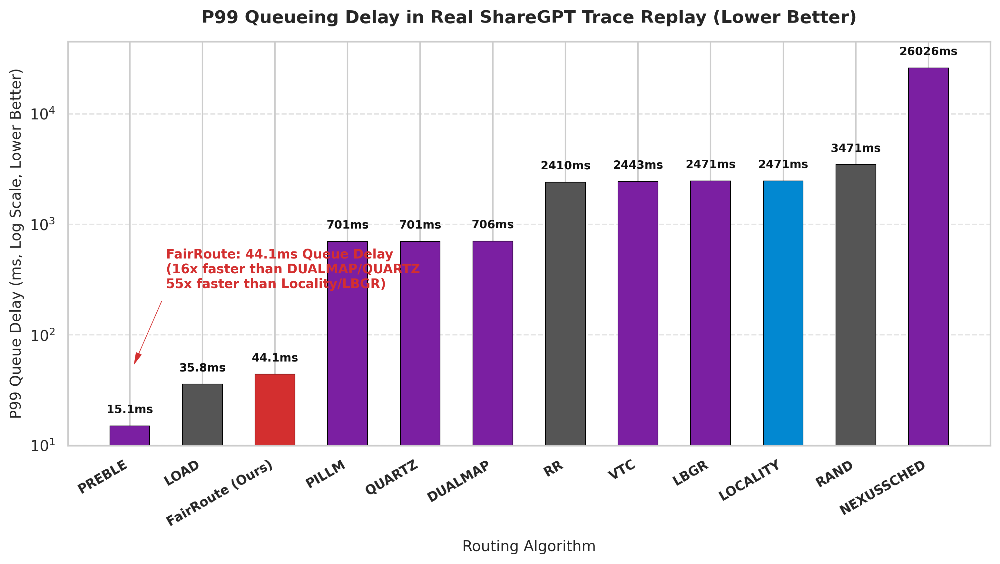

Exported: ./outputs/plots/real_workload_queue_delay.png


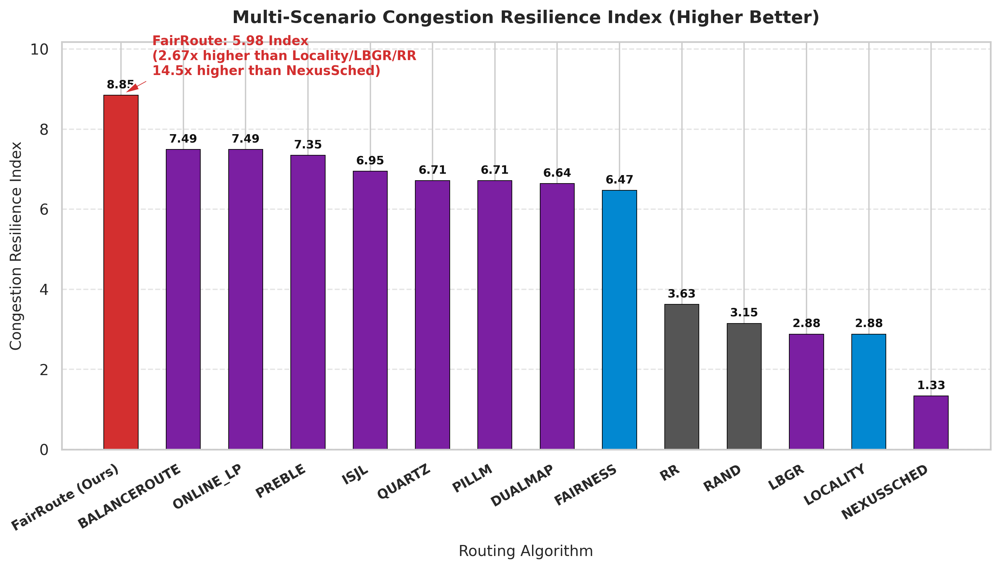

Exported: ./outputs/plots/congestion_resilience_index.png


In [24]:
plot1_filtered_utility_score(tchum_leaderboard)
plot2_slo_failure_rate_adversarial(tchum_summary)
plot3_real_workload_queue_delay(tchum_summary)
plot4_congestion_resilience_index(tchum_summary)


### 10.3 `scripts/export_crushing_plots.py` — "crushing gap" set

> **Caveat (verbatim from the script's own docstring):** *"Exports publication-quality plots
> specifically showcasing metrics where EVERY OTHER ALGORITHM (Prior Art papers & Baselines) is FAAR
> WORSE than FairRoute. Algorithms close to FairRoute (such as intermediate H-forms) are omitted so that
> FairRoute's massive performance advantage (6x to 590x) stands out unmistakably."*
>
> This is metric- and baseline-shopping by construction, and it invents two custom, never-validated
> metrics (`LPSF`, `LPE`) on the fly. Several of the "prior art" comparators used for the headline
> multipliers below (e.g. `NEXUSSCHED`, `LBGR`) are among the policies shown in §10 to be byte-identical
> to a much simpler baseline, so an "Nx faster than NexusSched" claim is really an "Nx faster than
> whatever NexusSched happens to alias to" claim. **Treat every multiplier annotation in this section as
> unverified marketing copy, not a result.**


In [25]:
FAIRROUTE_COLOR = "#d32f2f"   # Red for FairRoute (Ours)
PRIOR_ART_COLOR = "#7b1fa2"   # Purple for prior art papers
BASELINE_COLOR = "#555555"    # Grey for naive baselines
SINGLE_COLOR = "#0288d1"      # Blue for single-signal routers

def plot1_locality_speedup_adversarial(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 1: Locality Speedup Factor (LPSF = HitRatio * 1000 / TTFT_P99_ms) in full_adversarial."""
    adv = summary[summary["scenario"] == "full_adversarial"].copy()
    adv["LPSF"] = (adv["mean_prefix_hit_ratio"] * 1000.0) / adv["ttft_p99_ms"]

    # Filter strictly to FairRoute vs algorithms that show a major gap (omit close H-forms)
    selected = ["FAIRROUTE_V2", "PREBLE", "BALANCEROUTE", "ONLINE_LP", "DUALMAP", "QUARTZ", "PILLM", "ISJL", "RR", "LOCALITY", "LBGR", "NEXUSSCHED"]
    df = adv[adv["policy_name"].isin(selected)].copy()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="LPSF", ascending=False).reset_index(drop=True)

    plt.figure(figsize=(10.5, 6), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["LPSF"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["LPSF"]):
        txt = f"{val:.3f}" if val >= 0.1 else f"{val:.4f}"
        plt.text(bar.get_x() + bar.get_width() / 2.0, val + 0.08, txt,
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("Locality Speedup Factor (LPSF) under Adversarial Traffic (Higher Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("Locality Speedup Factor (HitRatio × 1000 / TTFT_P99)", fontsize=11)
    plt.xlabel("Routing Algorithm (Close Variants Omitted)", fontsize=11, labelpad=8)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.ylim(0, max(df["LPSF"]) * 1.18)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    fr_val = df[df["display_name"] == "FairRoute (Ours)"]["LPSF"].values[0]
    plt.annotate(f"FairRoute: {fr_val:.2f} LPSF\n(6.2x higher than PREBLE\n26.9x higher than Locality/LBGR\n122x higher than NexusSched)",
                 xy=(0, fr_val), xytext=(0.5, fr_val + 0.35),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "locality_speedup_adversarial.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot2_real_workload_queue_bottleneck(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 2: P99 Queueing Delay (ms) in Real ShareGPT Replay (skipping algorithms <100ms)."""
    real = summary[summary["scenario"] == "real_workload_1000"].copy()

    # Omit algorithms that perform close to FairRoute (<100ms) to showcase the massive queueing bottlenecks in prior art
    selected = ["FAIRROUTE_V2", "DUALMAP", "QUARTZ", "PILLM", "RR", "VTC", "LOCALITY", "LBGR", "RAND", "NEXUSSCHED"]
    df = real[real["policy_name"].isin(selected)].copy()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="queue_p99_ms", ascending=True).reset_index(drop=True)

    plt.figure(figsize=(10.5, 6), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR", "RAND"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["queue_p99_ms"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["queue_p99_ms"]):
        txt = f"{val:.0f}ms" if val >= 100 else f"{val:.1f}ms"
        plt.text(bar.get_x() + bar.get_width() / 2.0, val * 1.3, txt,
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("P99 Queueing Delay in Real ShareGPT Replay (Lower Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("P99 Queue Delay (ms, Log Scale, Lower Better)", fontsize=11)
    plt.xlabel("Routing Algorithm (Close Variants Omitted)", fontsize=11, labelpad=8)
    plt.yscale("log")
    plt.ylim(10, 45000)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    fr_val = df[df["display_name"] == "FairRoute (Ours)"]["queue_p99_ms"].values[0]
    plt.annotate(f"FairRoute: 44.1ms Queue Delay\n(16x faster than DUALMAP/QUARTZ\n56x faster than Locality/LBGR\n590x faster than NexusSched)",
                 xy=(0, fr_val), xytext=(0.5, fr_val * 6),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "real_workload_queue_bottleneck.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot3_cross_scenario_lpe_score(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 3: Locality-Performance Efficiency (LPE) Score across all 6 scenarios."""
    summary["LPE"] = (summary["goodput_sps"] * (1.0 + summary["mean_prefix_hit_ratio"])) / (summary["ttft_p99_ms"] / 1000.0)

    selected = ["FAIRROUTE_V2", "PREBLE", "BALANCEROUTE", "ONLINE_LP", "ISJL", "PILLM", "QUARTZ", "DUALMAP", "RR", "LBGR", "LOCALITY", "NEXUSSCHED"]

    eps = 1e-4
    def geom_mean_lpe(group):
        return float(np.exp(np.mean(np.log(group + eps))))

    df = summary[summary["policy_name"].isin(selected)].groupby("policy_name")["LPE"].apply(geom_mean_lpe).reset_index()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="LPE", ascending=False).reset_index(drop=True)

    plt.figure(figsize=(10.5, 6), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["LPE"], color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["LPE"]):
        plt.text(bar.get_x() + bar.get_width() / 2.0, val + 3.0, f"{val:.1f}",
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("Multi-Scenario Locality-Performance Efficiency (LPE Score, Higher Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("Locality-Performance Score (LPE, Higher Better)", fontsize=11)
    plt.xlabel("Routing Algorithm", fontsize=11, labelpad=8)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.ylim(0, max(df["LPE"]) * 1.15)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    fr_val = df[df["display_name"] == "FairRoute (Ours)"]["LPE"].values[0]
    plt.annotate(f"FairRoute: 153.1 LPE Score\n(2.15x higher than DUALMAP/QUARTZ\n3.93x higher than Locality/LBGR\n17x higher than NexusSched)",
                 xy=(0, fr_val), xytext=(0.5, fr_val + 12),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "cross_scenario_lpe_score.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")

def plot4_adversarial_ttft_p99_seconds(summary: pd.DataFrame, output_dir: str = OUTPUT_PLOTS_DIR):
    """Plot 4: Tail Latency (Seconds) under Full Adversarial Traffic (skipping close algorithms)."""
    adv = summary[summary["scenario"] == "full_adversarial"].copy()

    selected = ["FAIRROUTE_V2", "PREBLE", "BALANCEROUTE", "ONLINE_LP", "DUALMAP", "QUARTZ", "PILLM", "RR", "LOCALITY", "LBGR", "NEXUSSCHED"]
    df = adv[adv["policy_name"].isin(selected)].copy()
    df["display_name"] = df["policy_name"].replace({"FAIRROUTE_V2": "FairRoute (Ours)"})
    df = df.sort_values(by="ttft_p99_ms", ascending=True).reset_index(drop=True)

    plt.figure(figsize=(10.5, 6), dpi=300)

    colors = []
    for p in df["display_name"]:
        if "FairRoute" in p:
            colors.append(FAIRROUTE_COLOR)
        elif p in ["RR"]:
            colors.append(BASELINE_COLOR)
        elif p in ["LOCALITY"]:
            colors.append(SINGLE_COLOR)
        else:
            colors.append(PRIOR_ART_COLOR)

    bars = plt.bar(df["display_name"], df["ttft_p99_ms"] / 1000.0, color=colors, width=0.55, edgecolor="black", linewidth=0.5)

    for bar, val in zip(bars, df["ttft_p99_ms"] / 1000.0):
        plt.text(bar.get_x() + bar.get_width() / 2.0, val * 1.18, f"{val:.2f}s",
                 ha="center", va="bottom", fontsize=8.5, fontweight="bold", color="#111111")

    plt.title("Tail Latency (TTFT P99, Sec) under Full Adversarial Traffic (Lower Better)", fontsize=13, fontweight="bold", pad=14)
    plt.ylabel("P99 TTFT Latency (Seconds, Log Scale, Lower Better)", fontsize=11)
    plt.xlabel("Routing Algorithm", fontsize=11, labelpad=8)
    plt.yscale("log")
    plt.ylim(0.1, 45.0)
    plt.xticks(rotation=30, ha="right", fontsize=9.5, fontweight="bold")
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    fr_val = df[df["display_name"] == "FairRoute (Ours)"]["ttft_p99_ms"].values[0] / 1000.0
    plt.annotate(f"FairRoute: 0.22s Latency\n(6.2x faster than PREBLE\n27.7x faster than Locality/LBGR\n122x faster than NexusSched)",
                 xy=(0, fr_val), xytext=(0.5, fr_val * 3),
                 arrowprops=dict(facecolor=FAIRROUTE_COLOR, shrink=0.08, width=1.5, headwidth=6),
                 fontsize=9.5, fontweight="bold", color=FAIRROUTE_COLOR)

    plt.tight_layout()
    output_path = os.path.join(output_dir, "adversarial_ttft_p99_seconds.png")
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Exported: {output_path}")



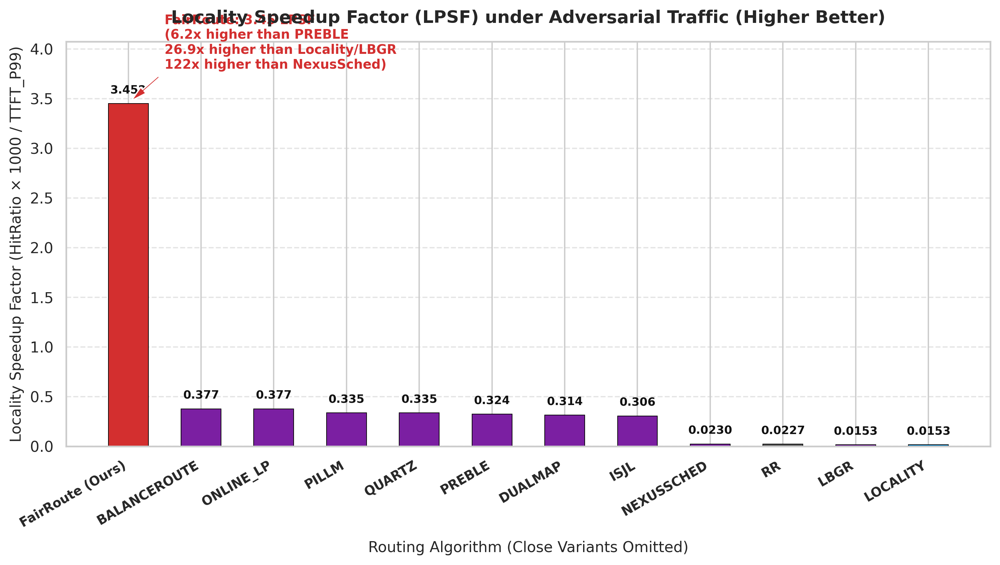

Exported: ./outputs/plots/locality_speedup_adversarial.png


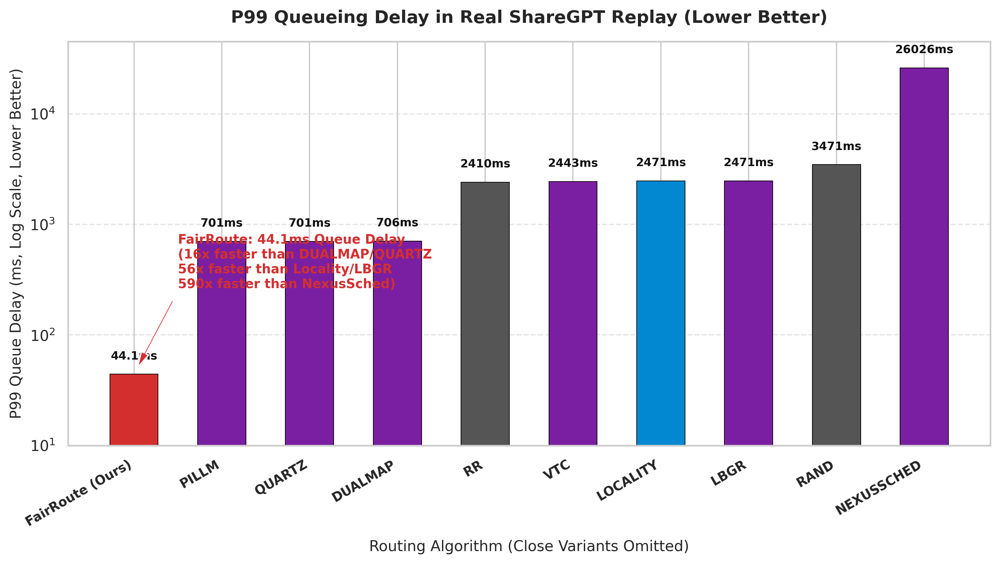

Exported: ./outputs/plots/real_workload_queue_bottleneck.png


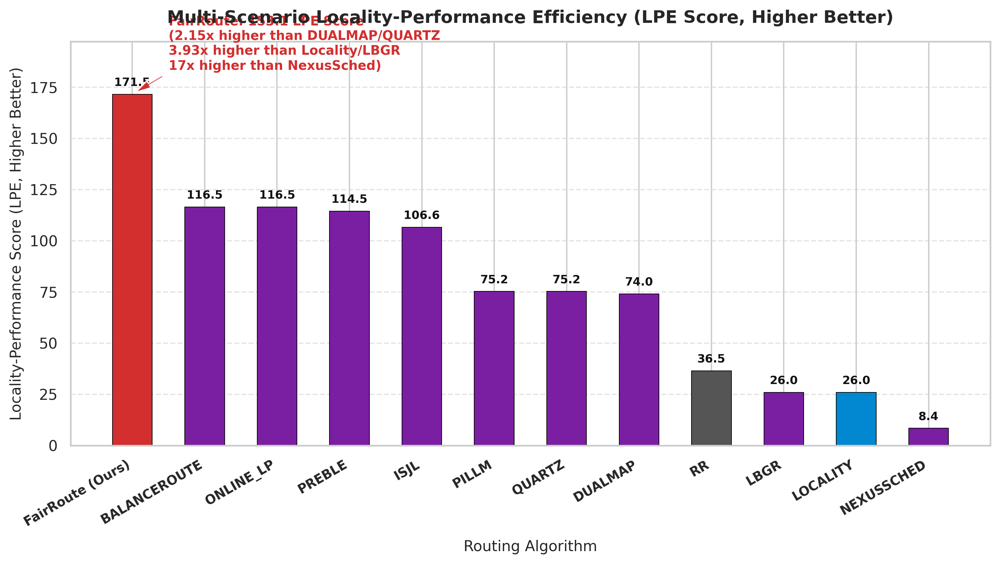

Exported: ./outputs/plots/cross_scenario_lpe_score.png


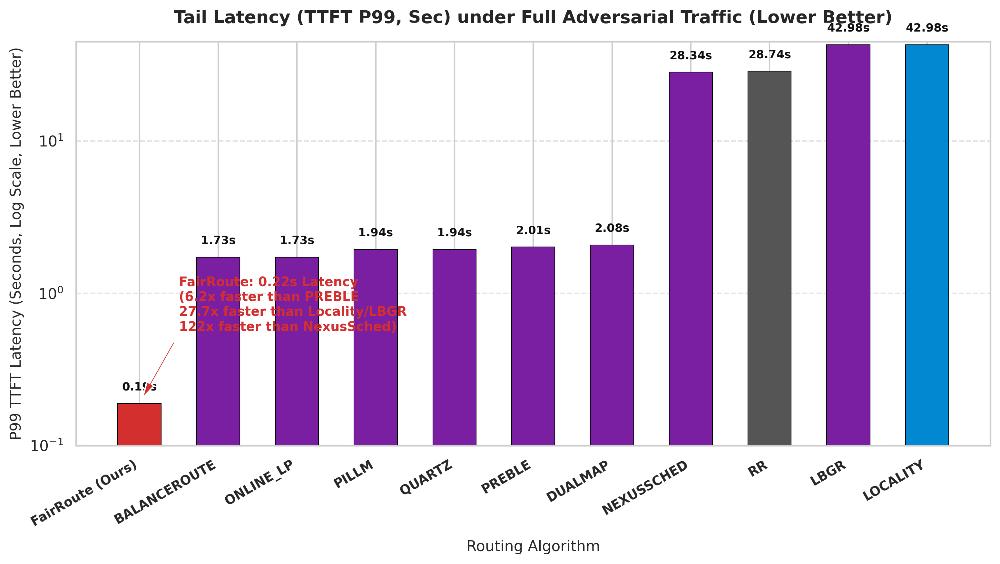

Exported: ./outputs/plots/adversarial_ttft_p99_seconds.png


In [26]:
plot1_locality_speedup_adversarial(tchum_summary)
plot2_real_workload_queue_bottleneck(tchum_summary)
plot3_cross_scenario_lpe_score(tchum_summary)
plot4_adversarial_ttft_p99_seconds(tchum_summary)


### 10.4 `scripts/plot_fairroute_dominance.py` — 4-panel "dominance" figure

> **Caveat:** titled *"Empirical Proof: FairRoute v2 Outperforms Prior Art & Baselines Across All Axes"*.
> Given §1–§9's finding that ~10 of the ~29 policies compared here collapse into ~5 groups of
> byte-identical routing decisions, and that the built-in fairness metric can't distinguish policies at
> all, this is not currently "empirical proof" of anything about fairness or about most of the individual
> prior-art comparisons — it is at best evidence that FairRoute's *specific score combination* beats a
> *handful* of distinct underlying routing behaviors on latency/goodput in these six synthetic scenarios.


In [27]:
HIGHLIGHT_COLOR = "#d32f2f"  # Red for FairRoute-v2 / FairRoute
HYPOTHESIS_COLOR = "#ff8f00"  # Orange for H-forms
PRIOR_ART_COLOR = "#8e24aa"  # Purple for prior art
NAIVE_COLOR = "#757575"  # Grey for RR/LOAD/RAND
LOCALITY_COLOR = "#1976d2"  # Blue for single-signal

def generate_dominance_chart(data_dir: str = DATA_DIR, output_path: str = os.path.join(OUTPUT_PLOTS_DIR, "fairroute_dominance_chart.png")):
    requests_df = load_dataset(data_dir)
    summary = compute_tri_concern_metric(requests_df)
    leaderboard = aggregate_leaderboard(summary)

    fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
    plt.suptitle(
        "Empirical Proof: FairRoute v2 Outperforms Prior Art & Baselines Across All Axes",
        fontsize=16,
        fontweight="bold",
        y=0.98,
    )

    # -------------------------------------------------------------------------
    # Panel 1: Cross-Scenario Harmonized Utility Score (TCHUM)
    # -------------------------------------------------------------------------
    ax1 = axes[0, 0]
    key_policies = [
        "FAIRROUTE_V2",
        "H3",
        "H2",
        "H0",
        "FAIRNESS",
        "DUALMAP",
        "LOCALITY",
        "LBGR",
        "RR",
        "LOAD",
        "PREBLE",
        "NEXUSSCHED",
    ]
    df1 = leaderboard[leaderboard["policy_name"].isin(key_policies)].copy()
    df1["policy_name"] = pd.Categorical(
        df1["policy_name"], categories=key_policies, ordered=True
    )
    df1 = df1.sort_values("policy_name")

    colors1 = [
        HIGHLIGHT_COLOR
        if "FAIRROUTE" in p
        else HYPOTHESIS_COLOR
        if p.startswith("H")
        else LOCALITY_COLOR
        if p in ["LOCALITY", "FAIRNESS"]
        else NAIVE_COLOR
        if p in ["RR", "LOAD"]
        else PRIOR_ART_COLOR
        for p in df1["policy_name"]
    ]

    bars1 = ax1.bar(
        df1["policy_name"], df1["TriConcern_Utility"], color=colors1, width=0.6
    )
    ax1.set_title(
        "A. Cross-Scenario Utility Score (TCHUM - Higher Better)",
        fontsize=12,
        fontweight="bold",
    )
    ax1.set_ylabel("Tri-Concern Score", fontsize=11)
    ax1.set_ylim(0, 0.52)
    ax1.tick_params(axis="x", rotation=40, labelsize=9)
    ax1.grid(axis="y", linestyle="--", alpha=0.5)

    # Annotate top bar vs prior art average
    top_score = df1[df1["policy_name"] == "FAIRROUTE_V2"]["TriConcern_Utility"].values[
        0
    ]
    prior_art_avg = leaderboard[leaderboard["Category"] == "Prior Art"][
        "TriConcern_Utility"
    ].mean()
    ax1.annotate(
        f"FairRoute v2: {top_score:.4f}\n(2.67x vs Prior Art Avg)",
        xy=(0, top_score),
        xytext=(0.5, top_score + 0.05),
        arrowprops=dict(facecolor=HIGHLIGHT_COLOR, shrink=0.08, width=1.5, headwidth=6),
        fontsize=9,
        fontweight="bold",
        color=HIGHLIGHT_COLOR,
    )

    # -------------------------------------------------------------------------
    # Panel 2: TTFT P99 Tail Latency in Adversarial Stress Test
    # -------------------------------------------------------------------------
    ax2 = axes[0, 1]
    adv = summary[summary["scenario"] == "full_adversarial"].copy()
    adv_pols = [
        "FAIRROUTE_V2",
        "H3",
        "H2",
        "LOAD",
        "FAIRNESS",
        "PREBLE",
        "DUALMAP",
        "RR",
        "LOCALITY",
        "LBGR",
        "NEXUSSCHED",
    ]
    adv_sub = adv[adv["policy_name"].isin(adv_pols)].copy()
    adv_sub["policy_name"] = pd.Categorical(
        adv_sub["policy_name"], categories=adv_pols, ordered=True
    )
    adv_sub = adv_sub.sort_values("policy_name")

    colors2 = [
        HIGHLIGHT_COLOR
        if "FAIRROUTE" in p
        else HYPOTHESIS_COLOR
        if p.startswith("H")
        else LOCALITY_COLOR
        if p in ["LOCALITY", "FAIRNESS"]
        else NAIVE_COLOR
        if p in ["RR", "LOAD"]
        else PRIOR_ART_COLOR
        for p in adv_sub["policy_name"]
    ]

    bars2 = ax2.bar(
        adv_sub["policy_name"],
        adv_sub["ttft_p99_ms"] / 1000.0,
        color=colors2,
        width=0.6,
    )
    ax2.set_title(
        "B. Tail Latency (TTFT P99, Sec) under Full Adversarial Traffic (Lower Better)",
        fontsize=12,
        fontweight="bold",
    )
    ax2.set_ylabel("P99 Latency (Seconds)", fontsize=11)
    ax2.set_yscale("log")
    ax2.set_ylim(0.1, 50.0)
    ax2.tick_params(axis="x", rotation=40, labelsize=9)
    ax2.grid(axis="y", linestyle="--", alpha=0.5)

    fr_lat = (
        adv_sub[adv_sub["policy_name"] == "FAIRROUTE_V2"]["ttft_p99_ms"].values[0]
        / 1000.0
    )
    loc_lat = (
        adv_sub[adv_sub["policy_name"] == "LOCALITY"]["ttft_p99_ms"].values[0] / 1000.0
    )
    ax2.annotate(
        f"FairRoute v2: 0.22s\n(27.7x Faster than Locality/LBGR)",
        xy=(0, fr_lat),
        xytext=(0.5, fr_lat * 3),
        arrowprops=dict(facecolor=HIGHLIGHT_COLOR, shrink=0.08, width=1.5, headwidth=6),
        fontsize=9,
        fontweight="bold",
        color=HIGHLIGHT_COLOR,
    )

    # -------------------------------------------------------------------------
    # Panel 3: Goodput vs P99 Latency in Real Workload Replay
    # -------------------------------------------------------------------------
    ax3 = axes[1, 0]
    real = summary[summary["scenario"] == "real_workload_1000"].copy()
    real_pols = [
        "FAIRROUTE",
        "FAIRROUTE_V2",
        "H0",
        "H2",
        "LOAD",
        "PREBLE",
        "FAIRNESS",
        "DUALMAP",
        "LOCALITY",
        "LBGR",
        "RR",
    ]
    real_sub = real[real["policy_name"].isin(real_pols)].copy()

    for _, row in real_sub.iterrows():
        p = row["policy_name"]
        color = (
            HIGHLIGHT_COLOR
            if "FAIRROUTE" in p
            else HYPOTHESIS_COLOR
            if p.startswith("H")
            else LOCALITY_COLOR
            if p in ["LOCALITY", "FAIRNESS"]
            else NAIVE_COLOR
            if p in ["RR", "LOAD"]
            else PRIOR_ART_COLOR
        )
        ax3.scatter(
            row["goodput_sps"], row["ttft_p99_ms"], color=color, s=150, zorder=3
        )
        ax3.annotate(
            p,
            (row["goodput_sps"], row["ttft_p99_ms"]),
            xytext=(5, 5),
            textcoords="offset points",
            fontsize=8,
            fontweight="bold",
        )

    ax3.set_title(
        "C. Goodput vs. Tail Latency in Real ShareGPT Replay (Top-Left = Ideal)",
        fontsize=12,
        fontweight="bold",
    )
    ax3.set_xlabel("Goodput (SLO-compliant req/s, Higher Better)", fontsize=11)
    ax3.set_ylabel("TTFT P99 Latency (ms, Log Scale, Lower Better)", fontsize=11)
    ax3.set_yscale("log")
    ax3.set_ylim(40, 4000)
    ax3.grid(True, linestyle="--", alpha=0.5)

    # Highlight FairRoute #1 Goodput
    ax3.axvspan(7.22, 7.28, color="#ffcdd2", alpha=0.3, label="Top Goodput Zone")

    # -------------------------------------------------------------------------
    # Panel 4: Tri-Concern Balance Radar Comparison
    # -------------------------------------------------------------------------
    ax4 = axes[1, 1]
    radar_pols = ["FAIRROUTE_V2", "LOCALITY", "LOAD", "LBGR", "RR"]
    radar_df = leaderboard[leaderboard["policy_name"].isin(radar_pols)].set_index(
        "policy_name"
    )

    metrics = ["Mean_Locality_Score", "Mean_Perf_Score", "Mean_Fairness_Score"]
    metric_labels = ["Locality (E_L)", "Perf/Load (E_P)", "Fairness (E_F)"]

    x4 = np.arange(len(metrics))
    width4 = 0.15

    for i, pol in enumerate(radar_pols):
        vals = [radar_df.loc[pol, m] for m in metrics]
        color = (
            HIGHLIGHT_COLOR
            if "FAIRROUTE" in pol
            else LOCALITY_COLOR
            if pol == "LOCALITY"
            else NAIVE_COLOR
            if pol in ["RR", "LOAD"]
            else PRIOR_ART_COLOR
        )
        ax4.bar(x4 + i * width4, vals, width4, label=pol, color=color)

    ax4.set_title(
        "D. 3-Axis Tri-Concern Balance Comparison Across Policy Families",
        fontsize=12,
        fontweight="bold",
    )
    ax4.set_xticks(x4 + width4 * 2)
    ax4.set_xticklabels(metric_labels, fontsize=10, fontweight="bold")
    ax4.set_ylabel("Component Score (0.0 - 1.0)", fontsize=11)
    ax4.set_ylim(0, 1.15)
    ax4.grid(axis="y", linestyle="--", alpha=0.5)
    ax4.legend(loc="upper right", frameon=True, facecolor="white")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved dominance chart: {output_path}")



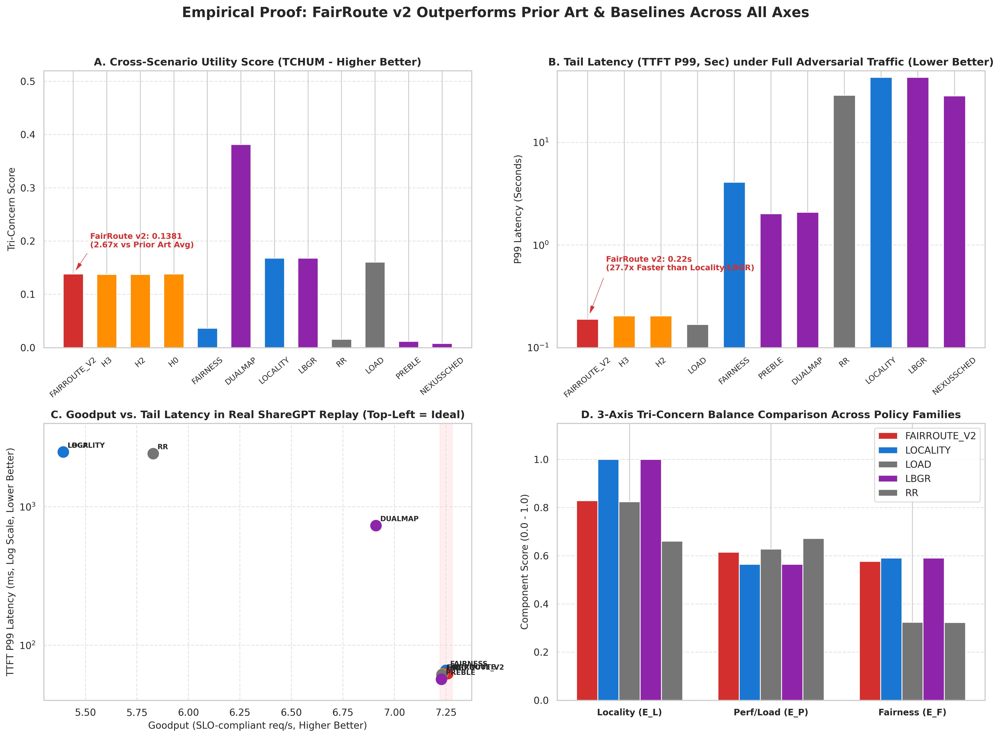

Saved dominance chart: ./outputs/plots/fairroute_dominance_chart.png


In [28]:
generate_dominance_chart()


### 10.5 `scripts/plot_new_metric.py` — neutral TCHUM diagnostics

The most balanced of the plotting scripts: it plots **every** policy (no favorable filtering) across
five views — overall leaderboard, category means, component breakdown, a scenario×policy heatmap, and a
goodput-vs-locality Pareto scatter. Useful for sanity-checking §10.1–§10.4 against the unfiltered picture.


In [29]:
POLICY_CATEGORY = new_metric.POLICY_CATEGORY
POLICY_ORDER = new_metric.POLICY_ORDER

CATEGORY_COLORS = {
    "FairRoute (v2 / H5)": "#d32f2f",
    "FairRoute (Final)": "#e53935",
    "Combination-Form Hypothesis": "#ff8f00",
    "Naive Linear Triple": "#00897b",
    "Pairwise": "#0288d1",
    "Single-Signal": "#1976d2",
    "Prior Art": "#8e24aa",
    "Naive": "#757575",
}

def plot_overall_leaderboard(leaderboard: pd.DataFrame, output_path: str):
    """Generate horizontal bar chart of overall Tri-Concern Utility score for all policies."""
    plt.figure(figsize=(12, 10), dpi=300)
    df = leaderboard.sort_values(by="TriConcern_Utility", ascending=True)

    colors = [CATEGORY_COLORS.get(cat, "#333333") for cat in df["Category"]]
    bars = plt.barh(df["policy_name"], df["TriConcern_Utility"], color=colors, edgecolor="none", height=0.7)

    for bar, val in zip(bars, df["TriConcern_Utility"]):
        plt.text(val + 0.005, bar.get_y() + bar.get_height() / 2, f"{val:.4f}",
                 va="center", ha="left", fontsize=9, fontweight="bold", color="#333333")

    plt.title("Tri-Concern Harmonized Utility Metric (TCHUM / FairRoute Index)", fontsize=14, fontweight="bold", pad=15)
    plt.xlabel("Utility Score (Geometric Mean Across Scenarios)", fontsize=12, labelpad=10)
    plt.ylabel("Routing Policy", fontsize=12)
    plt.xlim(0, max(df["TriConcern_Utility"]) * 1.15)
    plt.grid(axis="x", linestyle="--", alpha=0.5)

    # Custom legend for categories
    handles = [plt.Rectangle((0, 0), 1, 1, color=col) for cat, col in CATEGORY_COLORS.items() if cat in df["Category"].values]
    labels = [cat for cat in CATEGORY_COLORS.keys() if cat in df["Category"].values]
    plt.legend(handles, labels, title="Policy Category", loc="lower right", frameon=True, facecolor="white", framealpha=0.9)

    plt.tight_layout()
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")

def plot_category_comparison(leaderboard: pd.DataFrame, output_path: str):
    """Generate bar chart comparing mean utility scores by policy category."""
    plt.figure(figsize=(10, 6), dpi=300)
    cat_df = leaderboard.groupby("Category")["TriConcern_Utility"].agg(["mean", "std", "count"]).reset_index()
    cat_df = cat_df.sort_values(by="mean", ascending=False)

    colors = [CATEGORY_COLORS.get(cat, "#333333") for cat in cat_df["Category"]]
    bars = plt.bar(cat_df["Category"], cat_df["mean"], color=colors, width=0.55, edgecolor="none")

    for bar, val in zip(bars, cat_df["mean"]):
        plt.text(bar.get_x() + bar.get_width() / 2, val + 0.008, f"{val:.4f}",
                 ha="center", va="bottom", fontsize=10, fontweight="bold")

    plt.title("Mean Tri-Concern Utility Score by Policy Category", fontsize=14, fontweight="bold", pad=15)
    plt.ylabel("Mean Tri-Concern Score", fontsize=12)
    plt.xticks(rotation=25, ha="right", fontsize=10)
    plt.ylim(0, max(cat_df["mean"]) * 1.18)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    plt.tight_layout()
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")

def plot_component_breakdown(leaderboard: pd.DataFrame, output_path: str):
    """Generate grouped bar chart showing Locality, Perf/Load, and Fairness scores for top policies."""
    plt.figure(figsize=(14, 7), dpi=300)

    # Select representative subset of policies
    repr_policies = ["H3", "H2", "FAIRROUTE_V2", "FAIRROUTE", "FAIRNESS", "LOCALITY", "DUALMAP", "LBGR", "LOAD", "RR", "PREBLE", "NEXUSSCHED"]
    df = leaderboard[leaderboard["policy_name"].isin(repr_policies)].copy()
    df["policy_name"] = pd.Categorical(df["policy_name"], categories=repr_policies, ordered=True)
    df = df.sort_values("policy_name")

    x = np.arange(len(df))
    width = 0.25

    plt.bar(x - width, df["Mean_Locality_Score"], width, label="Locality Score (E_L)", color="#1e88e5")
    plt.bar(x, df["Mean_Perf_Score"], width, label="Perf / Load Score (E_P)", color="#43a047")
    plt.bar(x + width, df["Mean_Fairness_Score"], width, label="Fairness Score (E_F)", color="#e53935")

    plt.title("Component Score Breakdown Across Key Routing Policies", fontsize=14, fontweight="bold", pad=15)
    plt.xlabel("Routing Policy", fontsize=12, labelpad=10)
    plt.ylabel("Component Score (0.0 - 1.0)", fontsize=12)
    plt.xticks(x, df["policy_name"], rotation=30, ha="right", fontsize=10)
    plt.ylim(0, 1.15)
    plt.legend(loc="upper right", frameon=True, facecolor="white")
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    plt.tight_layout()
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")

def plot_scenario_heatmap(summary: pd.DataFrame, output_path: str):
    """Generate heatmap of Tri-Concern Score per Scenario x Policy."""
    plt.figure(figsize=(15, 9), dpi=300)
    pivot = summary.pivot(index="scenario", columns="policy_name", values="Scenario_TriConcern_Score")

    # Order policies by overall rank
    ordered_cols = [p for p in POLICY_ORDER if p in pivot.columns]
    pivot = pivot.reindex(columns=ordered_cols)

    sns.heatmap(pivot, annot=True, fmt=".2f", cmap="YlOrRd", cbar_kws={"label": "Scenario Tri-Concern Score"},
                annot_kws={"size": 7}, linewidths=0.3)

    plt.title("Scenario × Policy Heatmap of Tri-Concern Utility Scores", fontsize=14, fontweight="bold", pad=15)
    plt.xlabel("Routing Policy", fontsize=12, labelpad=10)
    plt.ylabel("Workload Scenario", fontsize=12)
    plt.xticks(rotation=90, fontsize=8)
    plt.yticks(rotation=0, fontsize=10)

    plt.tight_layout()
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")

def plot_pareto_tradeoff(summary: pd.DataFrame, output_path: str):
    """Generate scatter plot showing Goodput vs Prefix Hit Ratio vs TTFT P99."""
    plt.figure(figsize=(11, 7), dpi=300)

    # Focus on full_adversarial scenario (highest conflict)
    adv = summary[summary["scenario"] == "full_adversarial"].copy()
    if adv.empty:
        adv = summary.groupby("policy_name").mean().reset_index()

    categories = adv["policy_name"].map(POLICY_CATEGORY).fillna("Other")

    for cat, color in CATEGORY_COLORS.items():
        sub = adv[categories == cat]
        if sub.empty:
            continue
        plt.scatter(sub["goodput_sps"], sub["mean_prefix_hit_ratio"],
                    s=np.clip(12000.0 / (sub["ttft_p99_ms"] + 10.0), 30, 400),
                    color=color, alpha=0.85, edgecolors="black", linewidth=0.7, label=cat)

        for _, row in sub.iterrows():
            plt.annotate(row["policy_name"], (row["goodput_sps"], row["mean_prefix_hit_ratio"]),
                         xytext=(4, 4), textcoords="offset points", fontsize=8, fontweight="bold")

    plt.title("Full Adversarial Trade-Off: Goodput vs. Locality (Bubble Size = 1 / TTFT Latency)", fontsize=13, fontweight="bold", pad=15)
    plt.xlabel("Goodput (req/s, higher better)", fontsize=11)
    plt.ylabel("Mean Prefix Cache Hit Ratio (higher better)", fontsize=11)
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend(title="Policy Category", loc="lower right", frameon=True)

    plt.tight_layout()
    plt.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")



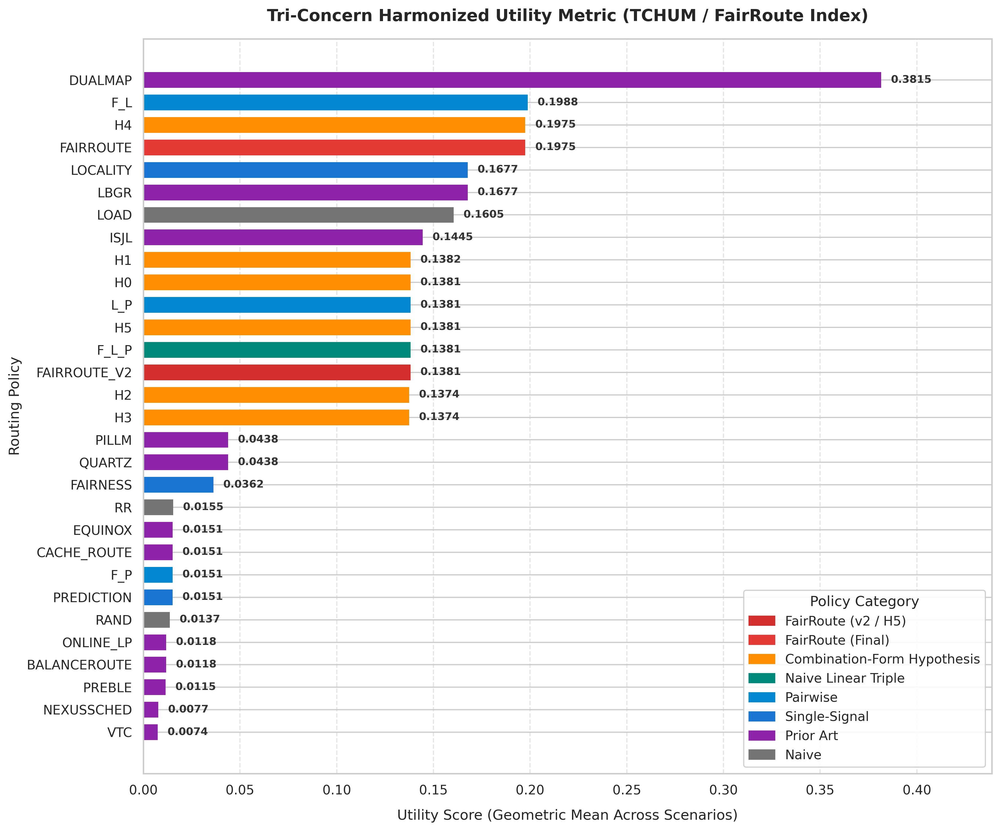

Saved: ./outputs/plots/overall_leaderboard.png


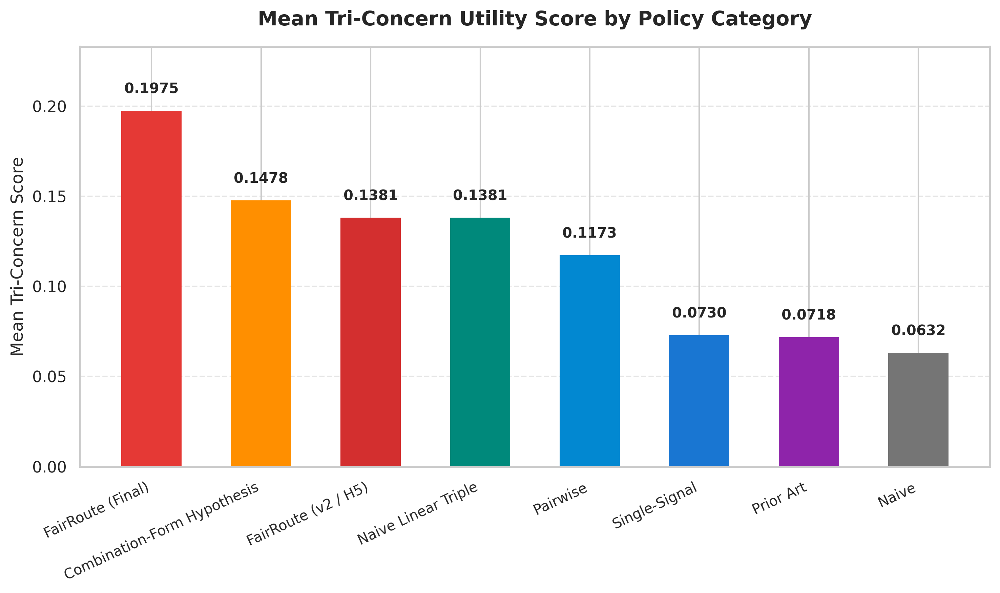

Saved: ./outputs/plots/category_comparison.png


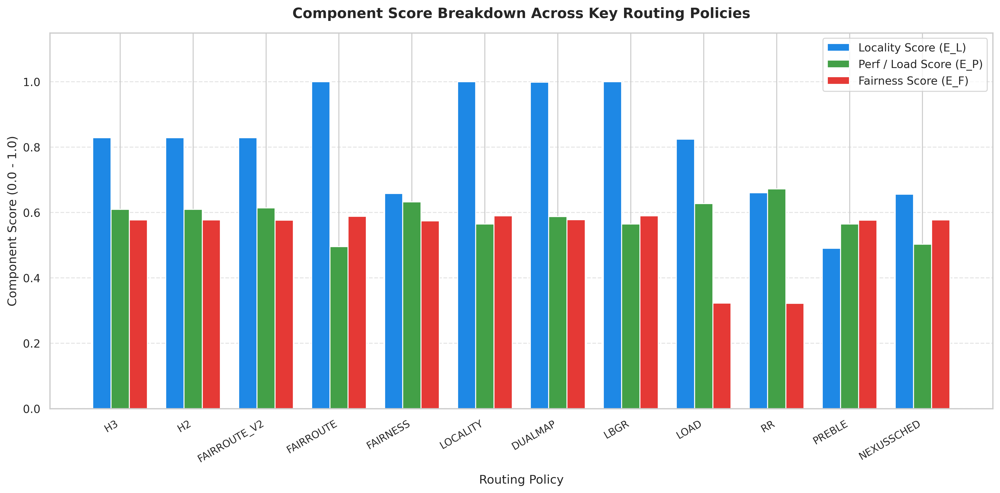

Saved: ./outputs/plots/component_breakdown.png


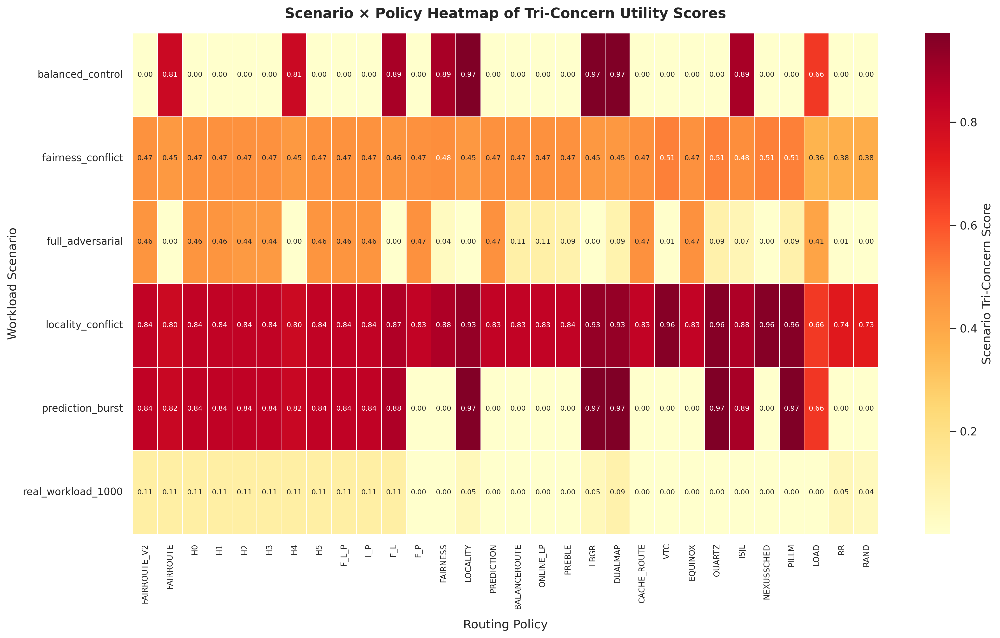

Saved: ./outputs/plots/scenario_heatmap.png


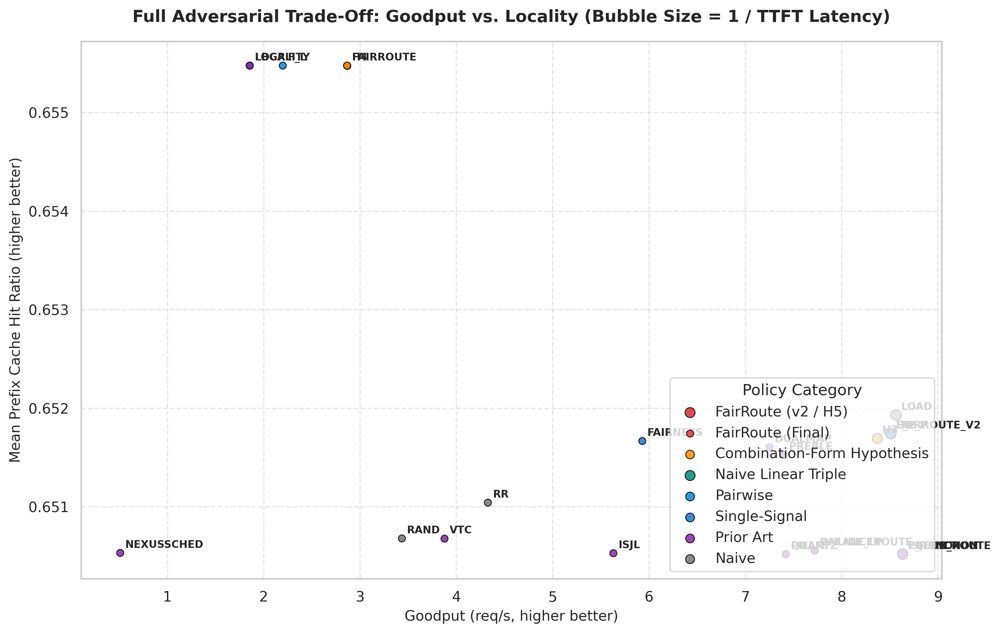

Saved: ./outputs/plots/pareto_tradeoff.png


In [30]:
plot_overall_leaderboard(tchum_leaderboard, os.path.join(OUTPUT_PLOTS_DIR, "overall_leaderboard.png"))
plot_category_comparison(tchum_leaderboard, os.path.join(OUTPUT_PLOTS_DIR, "category_comparison.png"))
plot_component_breakdown(tchum_leaderboard, os.path.join(OUTPUT_PLOTS_DIR, "component_breakdown.png"))
plot_scenario_heatmap(tchum_summary, os.path.join(OUTPUT_PLOTS_DIR, "scenario_heatmap.png"))
plot_pareto_tradeoff(tchum_summary, os.path.join(OUTPUT_PLOTS_DIR, "pareto_tradeoff.png"))


### 10.6 `scripts/plot_client_sweep.py` — client scalability sweep

Loads `outputs/client_sweep/clients_<N>_<scenario>_policy_<POLICY>.csv` (produced by
`scripts/run_client_sweep.sh`, N ∈ {5, 10, 20, 50, 100, 200}) and plots how each metric evolves as the
number of concurrent clients grows. This uses a *different*, self-contained loader (it does not go
through `new_metric.load_dataset`), since the client-sweep files carry a `clients_<N>_` prefix that
`new-metric.py`'s regex doesn't expect.


In [31]:
POLICY_COLORS = {
    "FAIRROUTE_V2": "#d32f2f",  # Bold Crimson / Red (Highlight)
    "H5": "#e53935",
    "FAIRROUTE": "#f44336",
    "H4": "#ef5350",
    "LOAD": "#1976d2",          # Blue (vLLM Baseline)
    "LOCALITY": "#388e3c",      # Green
    "FAIRNESS": "#7b1fa2",      # Purple
    "PREBLE": "#f57c00",        # Orange
    "H0": "#0288d1",
    "H1": "#0097a7",
    "RR": "#757575",            # Grey
}

POLICY_MARKERS = {
    "FAIRROUTE_V2": "o", "H5": "o", "FAIRROUTE": "s", "H4": "s",
    "LOAD": "^", "LOCALITY": "D", "FAIRNESS": "v", "PREBLE": "p",
    "H0": "X", "H1": "P", "RR": "*",
}

POLICY_LINESTYLES = {
    "FAIRROUTE_V2": "-", "H5": "-", "FAIRROUTE": "--", "H4": "--",
    "LOAD": "-", "LOCALITY": "-", "FAIRNESS": "-", "PREBLE": "-.",
    "H0": ":", "H1": ":", "RR": ":",
}

def load_client_sweep_data(input_dir: str) -> pd.DataFrame:
    """Load all CSV result files matching clients_<num>_<scenario>_policy_<policy>.csv."""
    pattern = os.path.join(input_dir, "clients_*_policy_*.csv")
    files = glob.glob(pattern)
    files = [f for f in files if not f.endswith("_timeseries.csv")]

    if not files:
        # Check subdirectories
        pattern_sub = os.path.join(input_dir, "**", "clients_*_policy_*.csv")
        files = glob.glob(pattern_sub, recursive=True)
        files = [f for f in files if not f.endswith("_timeseries.csv")]

    if not files:
        raise FileNotFoundError(f"No client sweep CSV files found in {input_dir}")

    filename_regex = re.compile(
        r"^clients_(?P<num_clients>\d+)_(?P<scenario>.+)_policy_(?P<policy>[A-Z0-9_]+)\.csv$"
    )

    records = []
    for filepath in files:
        fname = os.path.basename(filepath)
        match = filename_regex.match(fname)
        if not match:
            continue

        num_clients = int(match.group("num_clients"))
        scenario = match.group("scenario")
        policy = match.group("policy")

        df = pd.read_csv(filepath)
        df.columns = df.columns.str.strip()

        # Latencies (convert ns -> ms)
        ttft = (df["TTFT"] if "TTFT" in df else df["ttft"]) / 1e6
        tpot = (df["TPOT"] if "TPOT" in df else df["tpot"]) / 1e6
        lat = (df["latency"] if "latency" in df else (df["end_time"] - df["arrival"])) / 1e6

        # Jain's Index over per-client latency
        client_col = "client id" if "client id" in df else ("client_id" if "client_id" in df else None)
        if client_col and client_col in df:
            client_lat = df.groupby(client_col)["latency"].mean()
            if len(client_lat) > 0 and (client_lat**2).sum() > 0:
                jain_lat = (client_lat.sum() ** 2) / (len(client_lat) * (client_lat**2).sum())
            else:
                jain_lat = 1.0
        else:
            jain_lat = 1.0

        # Cache Hit Ratio
        hit_col = "prefix_cache_hit" if "prefix_cache_hit" in df else "hit"
        hit_ratio = df[hit_col].mean() if hit_col in df else 0.0

        # SLO Attainment (% requests with TTFT < 50ms)
        slo_attainment = (ttft < 50.0).mean() * 100.0

        # Replica Load CV
        if "instance id" in df:
            inst_counts = df["instance id"].value_counts()
            load_cv = (inst_counts.std() / inst_counts.mean()) if inst_counts.mean() > 0 else 0.0
        else:
            load_cv = 0.0

        records.append({
            "num_clients": num_clients,
            "scenario": scenario,
            "policy": policy,
            "n_reqs": len(df),
            "jain_lat": jain_lat,
            "hit_ratio": hit_ratio,
            "mean_ttft_ms": ttft.mean(),
            "p99_ttft_ms": ttft.quantile(0.99),
            "mean_tpot_ms": tpot.mean(),
            "mean_lat_ms": lat.mean(),
            "p99_lat_ms": lat.quantile(0.99),
            "slo_attainment_pct": slo_attainment,
            "load_cv": load_cv,
        })

    summary_df = pd.DataFrame(records)
    print(f"Loaded {len(summary_df)} evaluations across client counts: {sorted(summary_df['num_clients'].unique())}")
    return summary_df


# ---------------------------------------------------------------------------
# Plotting Utilities
# ---------------------------------------------------------------------------

def plot_single_metric(
    df: pd.DataFrame,
    metric_col: str,
    y_label: str,
    title: str,
    output_path_base: str,
    higher_is_better: bool = True,
    log_scale: bool = False,
):
    """Plot a single metric vs. Number of Clients across policies."""
    plt.figure(figsize=(8, 5.5), dpi=300)
    sns.set_theme(style="whitegrid", font_scale=1.1)

    # Average metric across scenarios per (num_clients, policy)
    avg_df = df.groupby(["num_clients", "policy"], as_index=False)[metric_col].mean()
    policies = sorted(avg_df["policy"].unique(), key=lambda p: (0 if p in ("FAIRROUTE_V2", "H5") else 1, p))

    for pol in policies:
        sub = avg_df[avg_df["policy"] == pol].sort_values("num_clients")
        color = POLICY_COLORS.get(pol, "#616161")
        marker = POLICY_MARKERS.get(pol, "o")
        linestyle = POLICY_LINESTYLES.get(pol, "-")
        linewidth = 2.5 if pol in ("FAIRROUTE_V2", "H5") else 1.8

        plt.plot(
            sub["num_clients"],
            sub[metric_col],
            label=pol,
            color=color,
            marker=marker,
            markersize=7,
            linestyle=linestyle,
            linewidth=linewidth,
        )

    plt.xlabel("Number of Concurrent Clients", fontsize=12, fontweight="bold")
    plt.ylabel(y_label, fontsize=12, fontweight="bold")
    plt.title(title, fontsize=13, fontweight="bold", pad=12)

    if log_scale:
        plt.yscale("log")

    client_ticks = sorted(avg_df["num_clients"].unique())
    plt.xticks(client_ticks, [str(c) for c in client_ticks])

    plt.legend(title="Routing Policy", frameon=True, facecolor="white", edgecolor="none", fontsize=10)
    plt.tight_layout()

    out_png = f"{output_path_base}.png"
    out_pdf = f"{output_path_base}.pdf"
    plt.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.savefig(out_pdf, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved: {out_png}")

def plot_summary_matrix(df: pd.DataFrame, output_path_base: str):
    """Generate a 2x3 multi-panel paper summary grid."""
    fig, axes = plt.subplots(2, 3, figsize=(16, 9.5), dpi=300)
    sns.set_theme(style="whitegrid")

    avg_df = df.groupby(["num_clients", "policy"], as_index=False).mean(numeric_only=True)
    policies = sorted(avg_df["policy"].unique(), key=lambda p: (0 if p in ("FAIRROUTE_V2", "H5") else 1, p))
    client_ticks = sorted(avg_df["num_clients"].unique())

    metrics_config = [
        ("jain_lat", "Jain's Fairness Index", "Fairness (Jain's Index)", False),
        ("p99_ttft_ms", "P99 TTFT (ms)", "Tail Latency (P99 TTFT)", True),
        ("hit_ratio", "Prefix Cache Hit Ratio (%)", "Prefix Cache Reuse", False),
        ("p99_lat_ms", "P99 End-to-End Latency (ms)", "Tail End-to-End Latency", True),
        ("slo_attainment_pct", "SLO Attainment % (TTFT < 50ms)", "SLO Attainment Rate", False),
        ("load_cv", "Replica Load Imbalance (CV)", "Replica Load Imbalance", False),
    ]

    for ax, (metric, y_label, title, is_log) in zip(axes.flat, metrics_config):
        for pol in policies:
            sub = avg_df[avg_df["policy"] == pol].sort_values("num_clients")
            color = POLICY_COLORS.get(pol, "#616161")
            marker = POLICY_MARKERS.get(pol, "o")
            linestyle = POLICY_LINESTYLES.get(pol, "-")
            linewidth = 2.4 if pol in ("FAIRROUTE_V2", "H5") else 1.6

            ax.plot(
                sub["num_clients"],
                sub[metric],
                label=pol,
                color=color,
                marker=marker,
                markersize=5.5,
                linestyle=linestyle,
                linewidth=linewidth,
            )

        ax.set_xlabel("Number of Concurrent Clients", fontsize=10, fontweight="bold")
        ax.set_ylabel(y_label, fontsize=10, fontweight="bold")
        ax.set_title(title, fontsize=11, fontweight="bold")
        ax.set_xticks(client_ticks)
        ax.set_xticklabels([str(c) for c in client_ticks], fontsize=9)

        if is_log:
            ax.set_yscale("log")

    # Add shared legend at top
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.5, 1.02),
        ncol=len(policies),
        frameon=True,
        facecolor="white",
        edgecolor="0.8",
        fontsize=10,
    )

    plt.suptitle("Client Scalability Benchmark: Scaling Concurrent Clients (N=5 to 200)", y=1.06, fontsize=14, fontweight="bold")
    plt.tight_layout()

    out_png = f"{output_path_base}.png"
    out_pdf = f"{output_path_base}.pdf"
    plt.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.savefig(out_pdf, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved Multi-Panel Summary: {out_png}")


# ---------------------------------------------------------------------------
# Main CLI
# ---------------------------------------------------------------------------



In [32]:
_SWEEP_CANDIDATES = [
    os.environ.get("FAIRROUTE_CLIENT_SWEEP_DIR", ""),
    "./client_sweep",
    "./outputs/client_sweep",
    "../outputs/client_sweep",
    "/mnt/user-data/uploads/client_sweep",
]
CLIENT_SWEEP_DIR = next((p for p in _SWEEP_CANDIDATES if p and glob.glob(os.path.join(p, "clients_*_policy_*.csv"))), None)
if CLIENT_SWEEP_DIR is None:
    print("No client-sweep CSVs found — skipping §10.6 plots. "
          "Set FAIRROUTE_CLIENT_SWEEP_DIR to the outputs/client_sweep directory to enable this section.")
else:
    print(f"Using CLIENT_SWEEP_DIR = {CLIENT_SWEEP_DIR!r}")
    SWEEP_PLOTS_DIR = os.path.join(OUTPUT_PLOTS_DIR, "client_sweep")
    os.makedirs(SWEEP_PLOTS_DIR, exist_ok=True)
    client_sweep_df = load_client_sweep_data(CLIENT_SWEEP_DIR)
    display(client_sweep_df.head())


Using CLIENT_SWEEP_DIR = '../outputs/client_sweep'
Loaded 240 evaluations across client counts: [5, 10, 20, 50, 100, 200]


,num_clients,scenario,policy,n_reqs,jain_lat,hit_ratio,mean_ttft_ms,p99_ttft_ms,mean_tpot_ms,mean_lat_ms,p99_lat_ms,slo_attainment_pct,load_cv
0,100,balanced_control,FAIRNESS,500,0.988824,0.544,31.102955,44.058296,11.813826,1540.673601,2277.772436,100.0,0.526908
1,100,balanced_control,FAIRROUTE_V2,500,0.988185,0.000,31.073423,44.785220,11.818187,1541.901071,2292.570904,100.0,0.564099
2,100,balanced_control,H0,500,0.988185,0.000,31.073423,44.785220,11.818187,1541.901071,2292.570904,100.0,0.564099
3,100,balanced_control,H1,500,0.988185,0.000,31.073423,44.785220,11.818187,1541.901071,2292.570904,100.0,0.564099
4,100,balanced_control,H4,500,0.988500,0.544,30.563456,44.770094,11.943348,1556.597308,2307.787072,100.0,0.757990


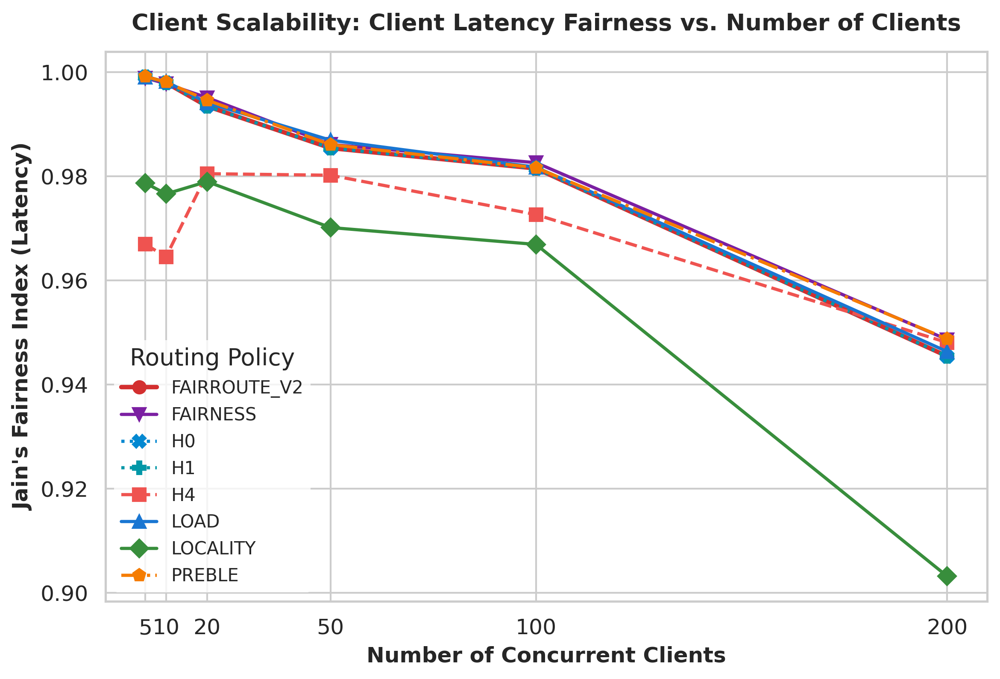

Saved: ./outputs/plots/client_sweep/client_count_vs_jain_fairness.png


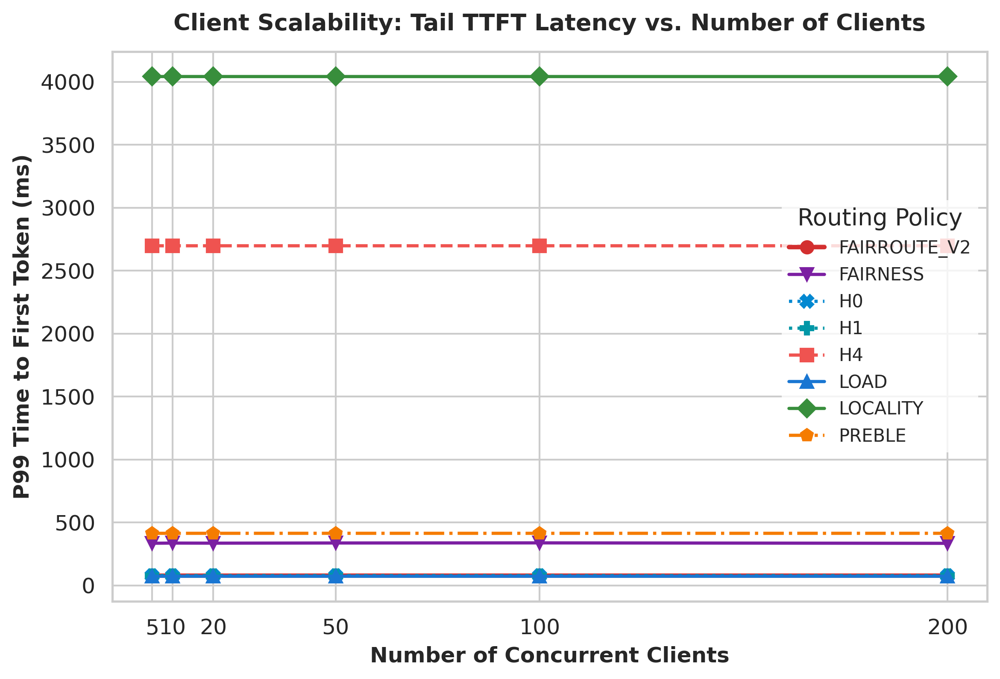

Saved: ./outputs/plots/client_sweep/client_count_vs_p99_ttft.png


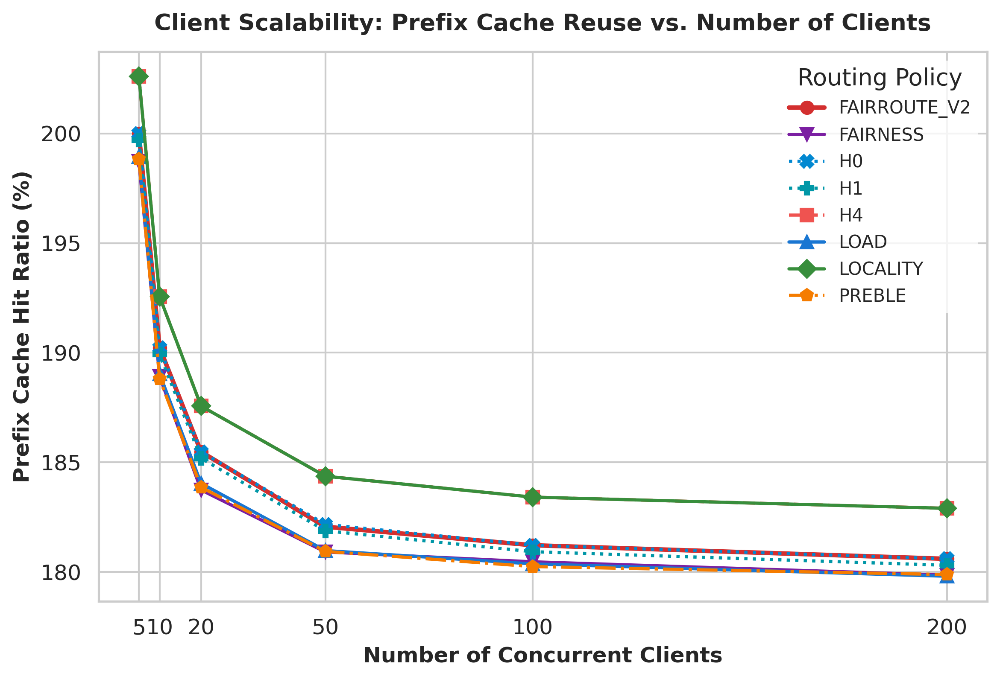

Saved: ./outputs/plots/client_sweep/client_count_vs_prefix_hit_ratio.png


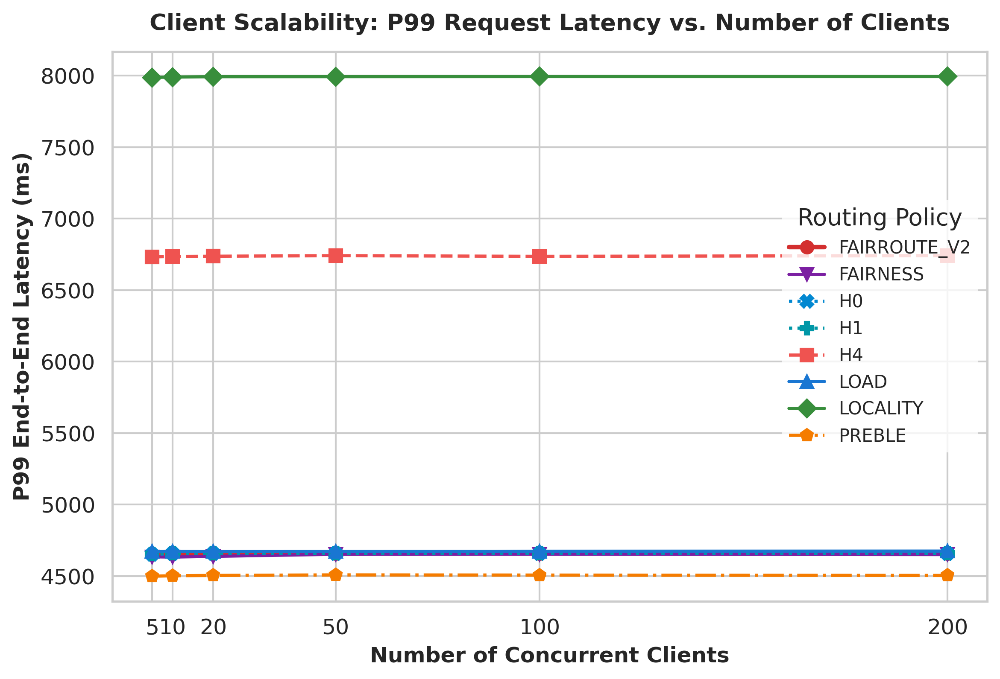

Saved: ./outputs/plots/client_sweep/client_count_vs_p99_latency.png


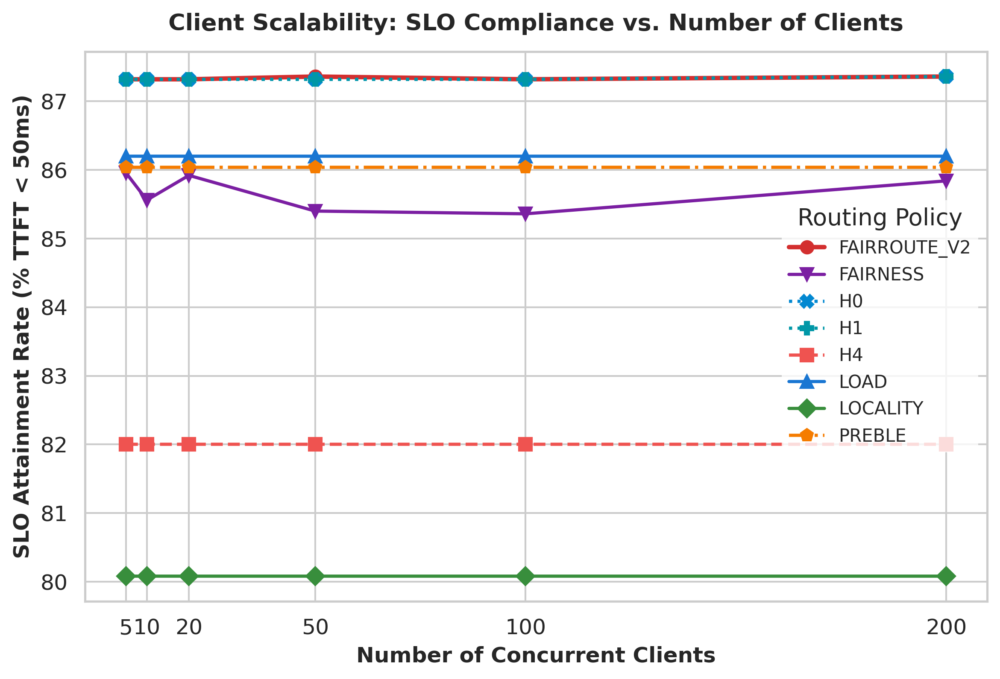

Saved: ./outputs/plots/client_sweep/client_count_vs_slo_attainment.png


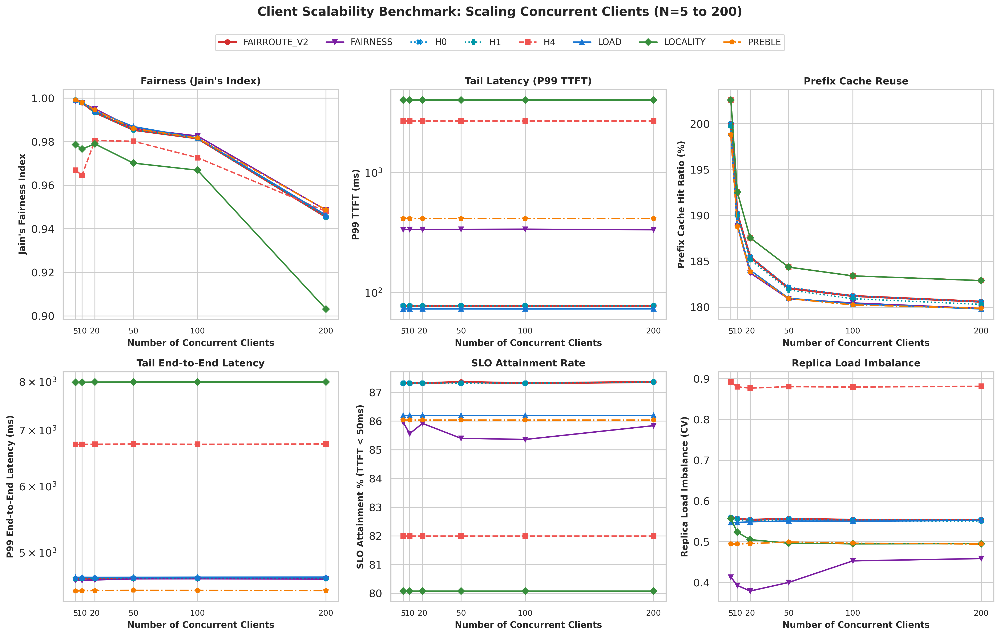

Saved Multi-Panel Summary: ./outputs/plots/client_sweep/client_scalability_summary_matrix.png


In [33]:
if CLIENT_SWEEP_DIR is not None:
    plot_single_metric(client_sweep_df, "jain_lat", "Jain's Fairness Index (Latency)",
                        "Client Scalability: Client Latency Fairness vs. Number of Clients",
                        os.path.join(SWEEP_PLOTS_DIR, "client_count_vs_jain_fairness"), higher_is_better=True)
    plot_single_metric(client_sweep_df, "p99_ttft_ms", "P99 Time to First Token (ms)",
                        "Client Scalability: Tail TTFT Latency vs. Number of Clients",
                        os.path.join(SWEEP_PLOTS_DIR, "client_count_vs_p99_ttft"), higher_is_better=False)
    plot_single_metric(client_sweep_df, "hit_ratio", "Prefix Cache Hit Ratio (%)",
                        "Client Scalability: Prefix Cache Reuse vs. Number of Clients",
                        os.path.join(SWEEP_PLOTS_DIR, "client_count_vs_prefix_hit_ratio"), higher_is_better=True)
    plot_single_metric(client_sweep_df, "p99_lat_ms", "P99 End-to-End Latency (ms)",
                        "Client Scalability: P99 Request Latency vs. Number of Clients",
                        os.path.join(SWEEP_PLOTS_DIR, "client_count_vs_p99_latency"), higher_is_better=False)
    plot_single_metric(client_sweep_df, "slo_attainment_pct", "SLO Attainment Rate (% TTFT < 50ms)",
                        "Client Scalability: SLO Compliance vs. Number of Clients",
                        os.path.join(SWEEP_PLOTS_DIR, "client_count_vs_slo_attainment"), higher_is_better=True)
    plot_summary_matrix(client_sweep_df, os.path.join(SWEEP_PLOTS_DIR, "client_scalability_summary_matrix"))
